# Your First GAN

### Goal
In this notebook, you're going to create your first generative adversarial network (GAN) for this course! Specifically, you will build and train a GAN that can generate hand-written images of digits (0-9). You will be using PyTorch in this specialization, so if you're not familiar with this framework, you may find the [PyTorch documentation](https://pytorch.org/docs/stable/index.html) useful. The hints will also often include links to relevant documentation.

### Learning Objectives
1.   Build the generator and discriminator components of a GAN from scratch.
2.   Create generator and discriminator loss functions.
3.   Train your GAN and visualize the generated images.


## Getting Started
You will begin by importing some useful packages and the dataset you will use to build and train your GAN. You are also provided with a visualizer function to help you investigate the images your GAN will create.


In [3]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST # Training dataset
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0) # Set for testing purposes, please do not change!

def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28)):
    '''
    Function for visualizing images: Given a tensor of images, number of images, and
    size per image, plots and prints the images in a uniform grid.
    '''
    image_unflat = image_tensor.detach().cpu().view(-1, *size)
    image_grid = make_grid(image_unflat[:num_images], nrow=5)
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    plt.show()

#### MNIST Dataset
The training images your discriminator will be using is from a dataset called [MNIST](http://yann.lecun.com/exdb/mnist/). It contains 60,000 images of handwritten digits, from 0 to 9, like these:

![MNIST Digits](MnistExamples.png)

You may notice that the images are quite pixelated -- this is because they are all only 28 x 28! The small size of its images makes MNIST ideal for simple training. Additionally, these images are also in black-and-white so only one dimension, or "color channel", is needed to represent them (more on this later in the course).

#### Tensor
You will represent the data using [tensors](https://pytorch.org/docs/stable/tensors.html). Tensors are a generalization of matrices: for example, a stack of three matrices with the amounts of red, green, and blue at different locations in a 64 x 64 pixel image is a tensor with the shape 3 x 64 x 64.

Tensors are easy to manipulate and supported by [PyTorch](https://pytorch.org/), the machine learning library you will be using. Feel free to explore them more, but you can imagine these as multi-dimensional matrices or vectors!

#### Batches
While you could train your model after generating one image, it is extremely inefficient and leads to less stable training. In GANs, and in machine learning in general, you will process multiple images per training step. These are called batches.

This means that your generator will generate an entire batch of images and receive the discriminator's feedback on each before updating the model. The same goes for the discriminator, it will calculate its loss on the entire batch of generated images as well as on the reals before the model is updated.

## Generator
The first step is to build the generator component.

You will start by creating a function to make a single layer/block for the generator's neural network. Each block should include a [linear transformation](https://pytorch.org/docs/stable/generated/torch.nn.Linear.html) to map to another shape, a [batch normalization](https://pytorch.org/docs/stable/generated/torch.nn.BatchNorm1d.html) for stabilization, and finally a non-linear activation function (you use a [ReLU here](https://pytorch.org/docs/master/generated/torch.nn.ReLU.html)) so the output can be transformed in complex ways. You will learn more about activations and batch normalization later in the course.

In [4]:
# UNQ_C1 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_generator_block
def get_generator_block(input_dim, output_dim):
    '''
    Function for returning a block of the generator's neural network
    given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a generator neural network layer, with a linear transformation 
          followed by a batch normalization and then a relu activation
    '''
    return nn.Sequential(
        # Hint: Replace all of the "None" with the appropriate dimensions.
        # The documentation may be useful if you're less familiar with PyTorch:
        # https://pytorch.org/docs/stable/nn.html.
        #### START CODE HERE ####
        nn.Linear(input_dim, output_dim),
        nn.BatchNorm1d(output_dim),
        nn.ReLU(inplace=True),
        #### END CODE HERE ####
    )

In [5]:
# Verify the generator block function
def test_gen_block(in_features, out_features, num_test=1000):
    block = get_generator_block(in_features, out_features)

    # Check the three parts
    assert len(block) == 3
    assert type(block[0]) == nn.Linear
    assert type(block[1]) == nn.BatchNorm1d
    assert type(block[2]) == nn.ReLU
    
    # Check the output shape
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)
    assert tuple(test_output.shape) == (num_test, out_features)
    assert test_output.std() > 0.55
    assert test_output.std() < 0.65

test_gen_block(25, 12)
test_gen_block(15, 28)
print("Success!")

Success!


Now you can build the generator class. It will take 3 values:

*   The noise vector dimension
*   The image dimension
*   The initial hidden dimension

Using these values, the generator will build a neural network with 5 layers/blocks. Beginning with the noise vector, the generator will apply non-linear transformations via the block function until the tensor is mapped to the size of the image to be outputted (the same size as the real images from MNIST). You will need to fill in the code for final layer since it is different than the others. The final layer does not need a normalization or activation function, but does need to be scaled with a [sigmoid function](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html). 

Finally, you are given a forward pass function that takes in a noise vector and generates an image of the output dimension using your neural network.

<details>

<summary>
<font size="3" color="green">
<b>Optional hints for <code><font size="4">Generator</font></code></b>
</font>
</summary>

1. The output size of the final linear transformation should be im_dim, but remember you need to scale the outputs between 0 and 1 using the sigmoid function.
2. [nn.Linear](https://pytorch.org/docs/master/generated/torch.nn.Linear.html) and [nn.Sigmoid](https://pytorch.org/docs/master/generated/torch.nn.Sigmoid.html) will be useful here. 
</details>


In [9]:
# UNQ_C2 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Generator
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
          (MNIST images are 28 x 28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_dim=784, hidden_dim=128):
        super(Generator, self).__init__()
        # Build the neural network
        self.gen = nn.Sequential(
            get_generator_block(z_dim, hidden_dim),
            get_generator_block(hidden_dim, hidden_dim * 2),
            get_generator_block(hidden_dim * 2, hidden_dim * 4),
            get_generator_block(hidden_dim * 4, hidden_dim * 8),
            # There is a dropdown with hints if you need them! 
            #### START CODE HERE ####
            nn.Linear(hidden_dim * 8, im_dim),
            nn.Sigmoid()
            #### END CODE HERE ####
        )
    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        return self.gen(noise)
    
    # Needed for grading
    def get_gen(self):
        '''
        Returns:
            the sequential model
        '''
        return self.gen

In [10]:
# Verify the generator class
def test_generator(z_dim, im_dim, hidden_dim, num_test=10000):
    gen = Generator(z_dim, im_dim, hidden_dim).get_gen()
    
    # Check there are six modules in the sequential part
    assert len(gen) == 6
    assert str(gen.__getitem__(4)).replace(' ', '') == f'Linear(in_features={hidden_dim * 8},out_features={im_dim},bias=True)'
    assert str(gen.__getitem__(5)).replace(' ', '') == 'Sigmoid()'
    test_input = torch.randn(num_test, z_dim)
    test_output = gen(test_input)

    # Check that the output shape is correct
    assert tuple(test_output.shape) == (num_test, im_dim)
    assert test_output.max() < 1, "Make sure to use a sigmoid"
    assert test_output.min() > 0, "Make sure to use a sigmoid"
    assert test_output.std() > 0.05, "Don't use batchnorm here"
    assert test_output.std() < 0.15, "Don't use batchnorm here"

test_generator(5, 10, 20)
test_generator(20, 8, 24)
print("Success!")

Success!


## Noise
To be able to use your generator, you will need to be able to create noise vectors. The noise vector z has the important role of making sure the images generated from the same class don't all look the same -- think of it as a random seed. You will generate it randomly using PyTorch by sampling random numbers from the normal distribution. Since multiple images will be processed per pass, you will generate all the noise vectors at once.

Note that whenever you create a new tensor using torch.ones, torch.zeros, or torch.randn, you either need to create it on the target device, e.g. `torch.ones(3, 3, device=device)`, or move it onto the target device using `torch.ones(3, 3).to(device)`. You do not need to do this if you're creating a tensor by manipulating another tensor or by using a variation that defaults the device to the input, such as `torch.ones_like`. In general, use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros` where possible.

<details>

<summary>
<font size="3" color="green">
<b>Optional hint for <code><font size="4">get_noise</font></code></b>
</font>
</summary>

1. 
You will probably find [torch.randn](https://pytorch.org/docs/master/generated/torch.randn.html) useful here.
</details>

In [13]:
# UNQ_C3 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_noise
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function for creating noise vectors: Given the dimensions (n_samples, z_dim),
    creates a tensor of that shape filled with random numbers from the normal distribution.
    Parameters:
        n_samples: the number of samples to generate, a scalar
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    '''
    # NOTE: To use this on GPU with device='cuda', make sure to pass the device 
    # argument to the function you use to generate the noise.
    #### START CODE HERE ####
    return torch.randn(n_samples , z_dim).to(device)
    #### END CODE HERE ####

In [14]:
# Verify the noise vector function
def test_get_noise(n_samples, z_dim, device='cpu'):
    noise = get_noise(n_samples, z_dim, device)
    
    # Make sure a normal distribution was used
    assert tuple(noise.shape) == (n_samples, z_dim)
    assert torch.abs(noise.std() - torch.tensor(1.0)) < 0.01
    assert str(noise.device).startswith(device)

test_get_noise(1000, 100, 'cpu')
if torch.cuda.is_available():
    test_get_noise(1000, 32, 'cuda')
print("Success!")

Success!


## Discriminator
The second component that you need to construct is the discriminator. As with the generator component, you will start by creating a function that builds a neural network block for the discriminator.

*Note: You use leaky ReLUs to prevent the "dying ReLU" problem, which refers to the phenomenon where the parameters stop changing due to consistently negative values passed to a ReLU, which result in a zero gradient. You will learn more about this in the following lectures!* 


REctified Linear Unit (ReLU) |  Leaky ReLU
:-------------------------:|:-------------------------:
![](relu-graph.png)  |  ![](lrelu-graph.png)





In [17]:
# UNQ_C4 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_discriminator_block
def get_discriminator_block(input_dim, output_dim):
    '''
    Discriminator Block
    Function for returning a neural network of the discriminator given input and output dimensions.
    Parameters:
        input_dim: the dimension of the input vector, a scalar
        output_dim: the dimension of the output vector, a scalar
    Returns:
        a discriminator neural network layer, with a linear transformation 
          followed by an nn.LeakyReLU activation with negative slope of 0.2 
          (https://pytorch.org/docs/master/generated/torch.nn.LeakyReLU.html)
    '''
    return nn.Sequential(
        #### START CODE HERE ####
        nn.Linear(input_dim , output_dim),
        nn.LeakyReLU(0.2)
        #### END CODE HERE ####
    )

In [18]:
# Verify the discriminator block function
def test_disc_block(in_features, out_features, num_test=10000):
    block = get_discriminator_block(in_features, out_features)

    # Check there are two parts
    assert len(block) == 2
    test_input = torch.randn(num_test, in_features)
    test_output = block(test_input)

    # Check that the shape is right
    assert tuple(test_output.shape) == (num_test, out_features)
    
    # Check that the LeakyReLU slope is about 0.2
    assert -test_output.min() / test_output.max() > 0.1
    assert -test_output.min() / test_output.max() < 0.3
    assert test_output.std() > 0.3
    assert test_output.std() < 0.5
    
    assert str(block.__getitem__(0)).replace(' ', '') == f'Linear(in_features={in_features},out_features={out_features},bias=True)'        
    assert str(block.__getitem__(1)).replace(' ', '').replace(',inplace=True', '') == 'LeakyReLU(negative_slope=0.2)'


test_disc_block(25, 12)
test_disc_block(15, 28)
print("Success!")

Success!


Now you can use these blocks to make a discriminator! The discriminator class holds 2 values:

*   The image dimension
*   The hidden dimension

The discriminator will build a neural network with 4 layers. It will start with the image tensor and transform it until it returns a single number (1-dimension tensor) output. This output classifies whether an image is fake or real. Note that you do not need a sigmoid after the output layer since it is included in the loss function. Finally, to use your discrimator's neural network you are given a forward pass function that takes in an image tensor to be classified.


In [19]:
# UNQ_C5 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: Discriminator
class Discriminator(nn.Module):
    '''
    Discriminator Class
    Values:
        im_dim: the dimension of the images, fitted for the dataset used, a scalar
            (MNIST images are 28x28 = 784 so that is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_dim=784, hidden_dim=128):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            get_discriminator_block(im_dim, hidden_dim * 4),
            get_discriminator_block(hidden_dim * 4, hidden_dim * 2),
            get_discriminator_block(hidden_dim * 2, hidden_dim),
            # Hint: You want to transform the final output into a single value,
            #       so add one more linear map.
            #### START CODE HERE ####
            nn.Linear(hidden_dim , 1)
            #### END CODE HERE ####
        )

    def forward(self, image):
        '''
        Function for completing a forward pass of the discriminator: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_dim)
        '''
        return self.disc(image)
    
    # Needed for grading
    def get_disc(self):
        '''
        Returns:
            the sequential model
        '''
        return self.disc

In [20]:
# Verify the discriminator class
def test_discriminator(z_dim, hidden_dim, num_test=100):
    
    disc = Discriminator(z_dim, hidden_dim).get_disc()

    # Check there are three parts
    assert len(disc) == 4
    assert type(disc.__getitem__(3)) == nn.Linear

    # Check the linear layer is correct
    test_input = torch.randn(num_test, z_dim)
    test_output = disc(test_input)
    assert tuple(test_output.shape) == (num_test, 1)

test_discriminator(5, 10)
test_discriminator(20, 8)
print("Success!")

Success!


## Training
Now you can put it all together!
First, you will set your parameters:
  *   criterion: the loss function
  *   n_epochs: the number of times you iterate through the entire dataset when training
  *   z_dim: the dimension of the noise vector
  *   display_step: how often to display/visualize the images
  *   batch_size: the number of images per forward/backward pass
  *   lr: the learning rate
  *   device: the device type, here using a GPU (which runs CUDA), not CPU

Next, you will load the MNIST dataset as tensors using a dataloader.



In [21]:
# Set your parameters
criterion = nn.BCEWithLogitsLoss()
n_epochs = 200
z_dim = 64
display_step = 500
batch_size = 128
lr = 0.00001
device = 'cuda'
# Load MNIST dataset as tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transforms.ToTensor()),
    batch_size=batch_size,
    shuffle=True)

Now, you can initialize your generator, discriminator, and optimizers. Note that each optimizer only takes the parameters of one particular model, since we want each optimizer to optimize only one of the models.

In [22]:
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
disc = Discriminator().to(device) 
disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)

Before you train your GAN, you will need to create functions to calculate the discriminator's loss and the generator's loss. This is how the discriminator and generator will know how they are doing and improve themselves. Since the generator is needed when calculating the discriminator's loss, you will need to call .detach() on the generator result to ensure that only the discriminator is updated!

Remember that you have already defined a loss function earlier (`criterion`) and you are encouraged to use `torch.ones_like` and `torch.zeros_like` instead of `torch.ones` or `torch.zeros`. If you use `torch.ones` or `torch.zeros`, you'll need to pass `device=device` to them.

In [36]:
# UNQ_C6 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_disc_loss
def get_disc_loss(gen, disc, criterion, real, num_images, z_dim, device):
    '''
    Return the loss of the discriminator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        real: a batch of real images
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        disc_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch (num_images) of fake images. 
    #            Make sure to pass the device argument to the noise.
    #       2) Get the discriminator's prediction of the fake image 
    #            and calculate the loss. Don't forget to detach the generator!
    #            (Remember the loss function you set earlier -- criterion. You need a 
    #            'ground truth' tensor in order to calculate the loss. 
    #            For example, a ground truth tensor for a fake image is all zeros.)
    #       3) Get the discriminator's prediction of the real image and calculate the loss.
    #       4) Calculate the discriminator's loss by averaging the real and fake loss
    #            and set it to disc_loss.
    #     Note: Please do not use concatenation in your solution. The tests are being updated to 
    #           support this, but for now, average the two losses as described in step (4).
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!
    #### START CODE HERE ####
    noise_vect = get_noise(num_images, z_dim, device=device)
    fake_imgs = gen(noise_vect)
    fake_preds = disc(fake_imgs.detach())
    fake_loss = criterion(fake_preds , torch.zeros_like(fake_preds))
    real_preds = disc(real)
    real_loss = criterion(real_preds , torch.ones_like(real_preds))
    disc_loss = (fake_loss + real_loss)/2
    
    #### END CODE HERE ####
    return disc_loss

In [37]:
def test_disc_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_disc_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None

    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.ones(num_images, 1)
    disc_loss = get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')
    assert tuple(disc_loss.shape) == (num_images, z_dim)
    assert torch.all(torch.abs(disc_loss - 0.5) < 1e-5)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    assert torch.all(torch.abs(get_disc_loss(gen, disc, criterion, real, num_images, z_dim, 'cpu')) < 1e-5)

def test_disc_loss(max_tests = 10):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    num_steps = 0
    for real, _ in dataloader:
        cur_batch_size = len(real)
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradient before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)
        assert (disc_loss - 0.68).abs() < 0.05

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Check that they detached correctly
        assert gen.gen[0][0].weight.grad is None

        # Update optimizer
        old_weight = disc.disc[0][0].weight.data.clone()
        disc_opt.step()
        new_weight = disc.disc[0][0].weight.data
        
        # Check that some discriminator weights changed
        assert not torch.all(torch.eq(old_weight, new_weight))
        num_steps += 1
        if num_steps >= max_tests:
            break

test_disc_reasonable()
test_disc_loss()
print("Success!")

Success!


In [40]:
# UNQ_C7 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: get_gen_loss
def get_gen_loss(gen, disc, criterion, num_images, z_dim, device):
    '''
    Return the loss of the generator given inputs.
    Parameters:
        gen: the generator model, which returns an image given z-dimensional noise
        disc: the discriminator model, which returns a single-dimensional prediction of real/fake
        criterion: the loss function, which should be used to compare 
               the discriminator's predictions to the ground truth reality of the images 
               (e.g. fake = 0, real = 1)
        num_images: the number of images the generator should produce, 
                which is also the length of the real images
        z_dim: the dimension of the noise vector, a scalar
        device: the device type
    Returns:
        gen_loss: a torch scalar loss value for the current batch
    '''
    #     These are the steps you will need to complete:
    #       1) Create noise vectors and generate a batch of fake images. 
    #           Remember to pass the device argument to the get_noise function.
    #       2) Get the discriminator's prediction of the fake image.
    #       3) Calculate the generator's loss. Remember the generator wants
    #          the discriminator to think that its fake images are real
    #     *Important*: You should NOT write your own loss function here - use criterion(pred, true)!

    #### START CODE HERE ####
    noise_vect = get_noise(num_images, z_dim, device=device)
    fake_imgs = gen(noise_vect)
    fake_preds = disc(fake_imgs)
    gen_loss = criterion(fake_preds , torch.ones_like(fake_preds))
    #### END CODE HERE ####
    return gen_loss

In [41]:
def test_gen_reasonable(num_images=10):
    # Don't use explicit casts to cuda - use the device argument
    import inspect, re
    lines = inspect.getsource(get_gen_loss)
    assert (re.search(r"to\(.cuda.\)", lines)) is None
    assert (re.search(r"\.cuda\(\)", lines)) is None
    
    z_dim = 64
    gen = torch.zeros_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)

    gen = torch.ones_like
    disc = nn.Identity()
    criterion = torch.mul # Multiply
    real = torch.zeros(num_images, 1)
    gen_loss_tensor = get_gen_loss(gen, disc, criterion, num_images, z_dim, 'cpu')
    assert torch.all(torch.abs(gen_loss_tensor - 1) < 1e-5)
    #Verify shape. Related to gen_noise parametrization
    assert tuple(gen_loss_tensor.shape) == (num_images, z_dim)
    

def test_gen_loss(num_images):
    z_dim = 64
    gen = Generator(z_dim).to(device)
    gen_opt = torch.optim.Adam(gen.parameters(), lr=lr)
    disc = Discriminator().to(device) 
    disc_opt = torch.optim.Adam(disc.parameters(), lr=lr)
    
    gen_loss = get_gen_loss(gen, disc, criterion, num_images, z_dim, device)
    
    # Check that the loss is reasonable
    assert (gen_loss - 0.7).abs() < 0.1
    gen_loss.backward()
    old_weight = gen.gen[0][0].weight.clone()
    gen_opt.step()
    new_weight = gen.gen[0][0].weight
    assert not torch.all(torch.eq(old_weight, new_weight))


test_gen_reasonable(10)
test_gen_loss(18)
print("Success!")

Success!


Finally, you can put everything together! For each epoch, you will process the entire dataset in batches. For every batch, you will need to update the discriminator and generator using their loss. Batches are sets of images that will be predicted on before the loss functions are calculated (instead of calculating the loss function after each image). Note that you may see a loss to be greater than 1, this is okay since binary cross entropy loss can be any positive number for a sufficiently confident wrong guess. 

It’s also often the case that the discriminator will outperform the generator, especially at the start, because its job is easier. It's important that neither one gets too good (that is, near-perfect accuracy), which would cause the entire model to stop learning. Balancing the two models is actually remarkably hard to do in a standard GAN and something you will see more of in later lectures and assignments.

After you've submitted a working version with the original architecture, feel free to play around with the architecture if you want to see how different architectural choices can lead to better or worse GANs. For example, consider changing the size of the hidden dimension, or making the networks shallower or deeper by changing the number of layers.

<!-- In addition, be warned that this runs very slowly on a CPU. One way to run this more quickly is to use Google Colab: 

1.   Download the .ipynb
2.   Upload it to Google Drive and open it with Google Colab
3.   Make the runtime type GPU (under “Runtime” -> “Change runtime type” -> Select “GPU” from the dropdown)
4.   Replace `device = "cpu"` with `device = "cuda"`
5.   Make sure your `get_noise` function uses the right device -->

But remember, don’t expect anything spectacular: this is only the first lesson. The results will get better with later lessons as you learn methods to help keep your generator and discriminator at similar levels.

You should roughly expect to see this progression. On a GPU, this should take about 15 seconds per 500 steps, on average, while on CPU it will take roughly 1.5 minutes:
![MNIST Digits](MNIST_Progression.png)

Step 500: Generator loss: 1.4314987955093395, discriminator loss: 0.41484469652175954


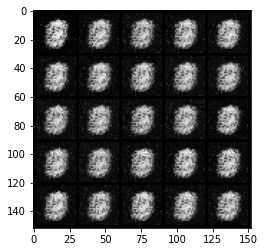

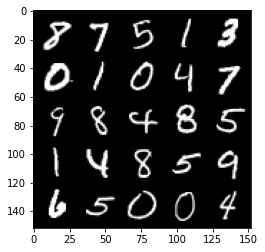

Step 1000: Generator loss: 1.734809967994692, discriminator loss: 0.291838410526514


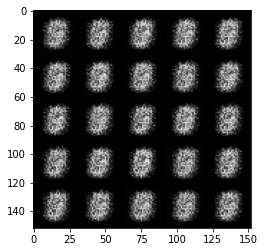

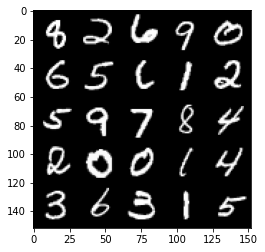

Step 1500: Generator loss: 2.0140996704101553, discriminator loss: 0.1793158265650273


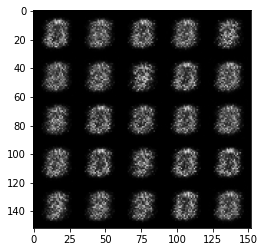

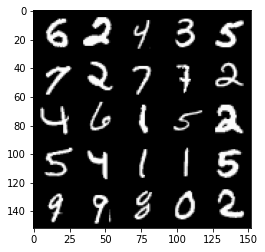

Step 2000: Generator loss: 1.7533460204601294, discriminator loss: 0.20960539457201963


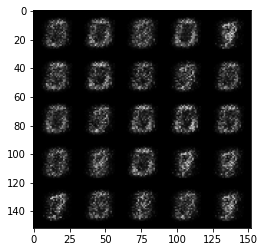

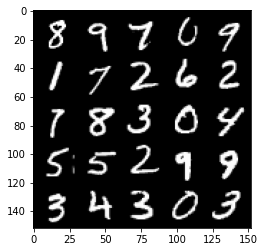

Step 2500: Generator loss: 1.7322350161075597, discriminator loss: 0.19853353580832483


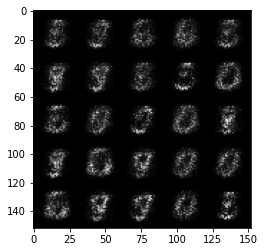

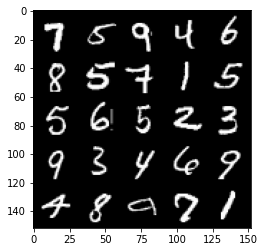

Step 3000: Generator loss: 1.8425032503604877, discriminator loss: 0.19145784437656393


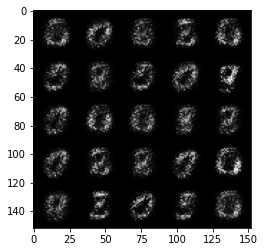

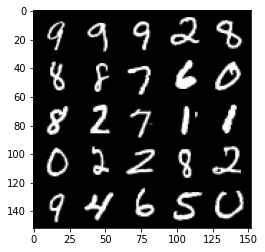

Step 3500: Generator loss: 2.1997476623058314, discriminator loss: 0.14873800857365124


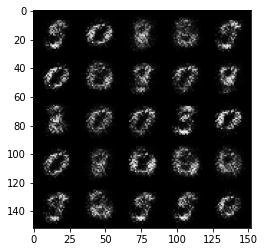

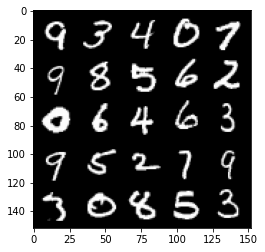

Step 4000: Generator loss: 2.7190359787940985, discriminator loss: 0.11355179838836194


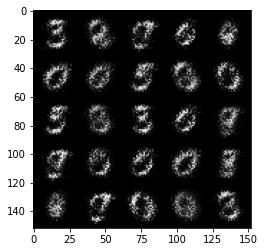

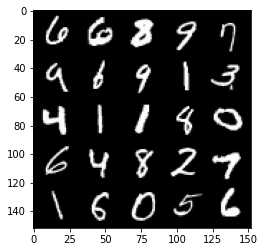

Step 4500: Generator loss: 2.939172525882718, discriminator loss: 0.114205650523305


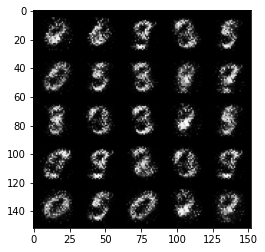

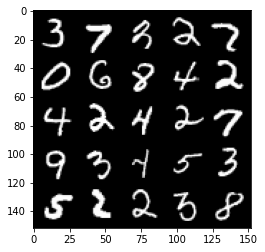

Step 5000: Generator loss: 3.1883126072883656, discriminator loss: 0.11193717040121562


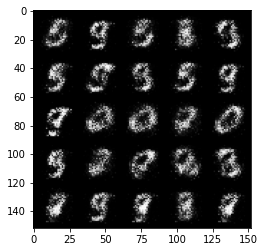

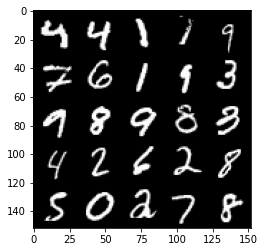

Step 5500: Generator loss: 3.350065886497499, discriminator loss: 0.09571975006908184


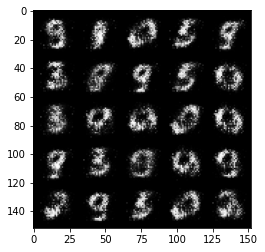

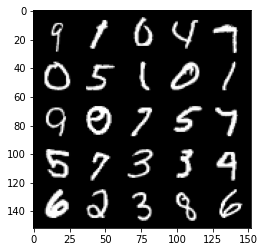

Step 6000: Generator loss: 3.5507308688163786, discriminator loss: 0.08090707393735658


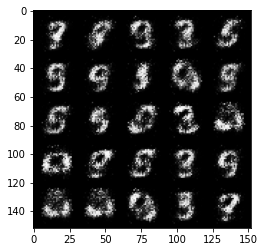

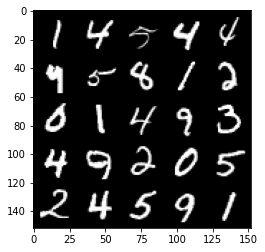

Step 6500: Generator loss: 3.7578935832977276, discriminator loss: 0.07294259870052341


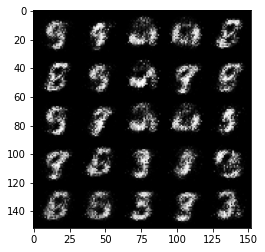

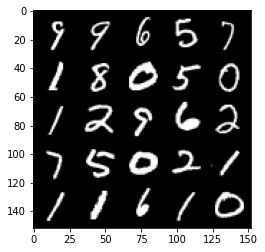

Step 7000: Generator loss: 3.812160710811613, discriminator loss: 0.06748256102204321


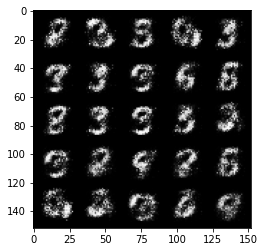

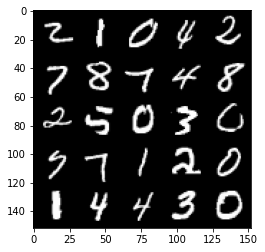

Step 7500: Generator loss: 3.9290060706138603, discriminator loss: 0.0655041290298104


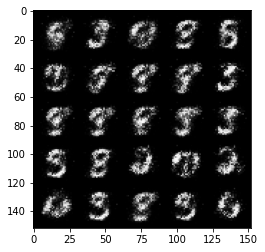

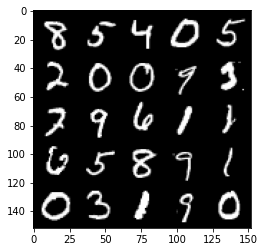

Step 8000: Generator loss: 4.035917766571043, discriminator loss: 0.06774361500889067


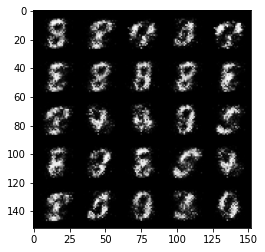

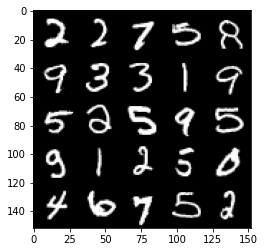

Step 8500: Generator loss: 4.06163276720047, discriminator loss: 0.0694521483033895


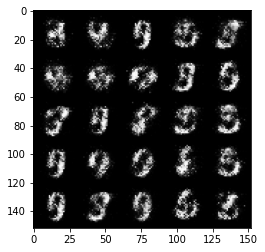

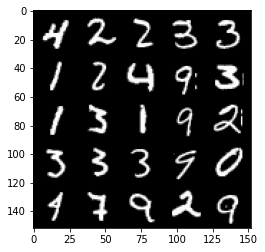

Step 9000: Generator loss: 4.207509435653687, discriminator loss: 0.05670878522470591


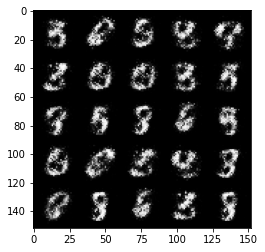

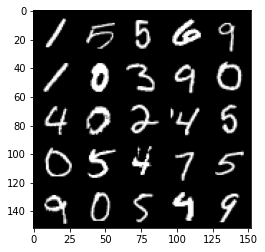

Step 9500: Generator loss: 4.335808521270749, discriminator loss: 0.05288339338079091


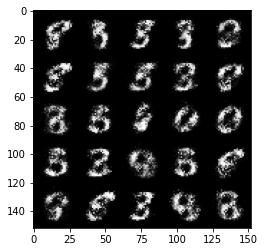

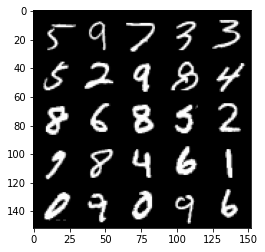

Step 10000: Generator loss: 4.232166938304903, discriminator loss: 0.054461911223828784


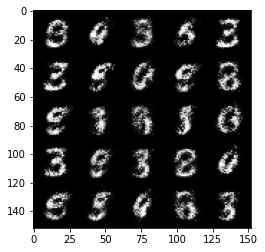

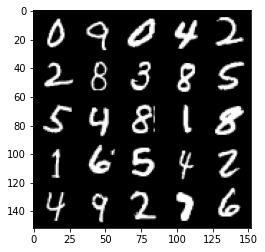

Step 10500: Generator loss: 4.248365934371951, discriminator loss: 0.0558835859559476


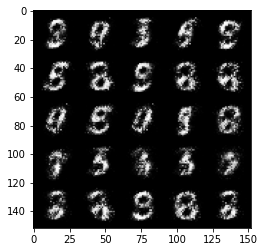

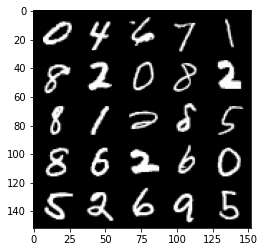

Step 11000: Generator loss: 4.242376938819885, discriminator loss: 0.06026552762836213


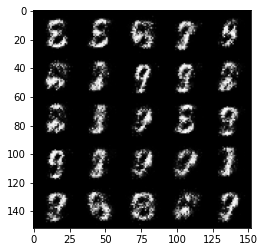

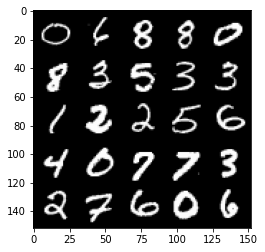

Step 11500: Generator loss: 4.330919727325441, discriminator loss: 0.06414146394282584


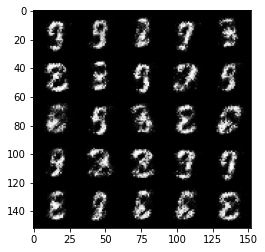

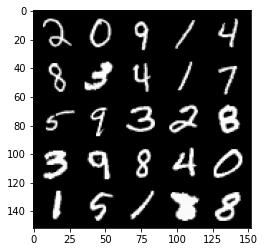

Step 12000: Generator loss: 4.329740744590759, discriminator loss: 0.07087917488440874


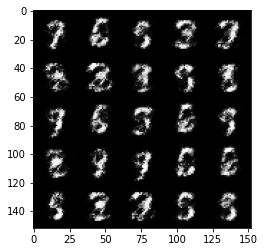

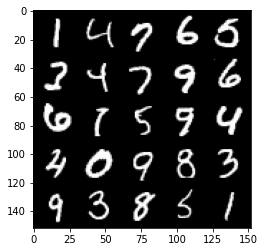

Step 12500: Generator loss: 4.1985482373237595, discriminator loss: 0.0799278013855219


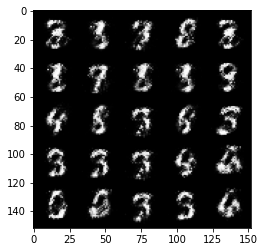

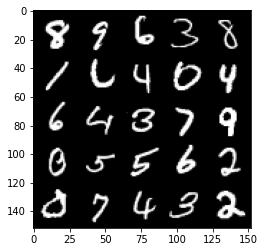

Step 13000: Generator loss: 4.157885504722594, discriminator loss: 0.07916624312847849


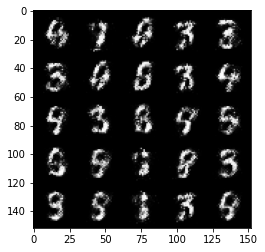

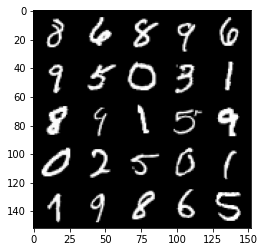

Step 13500: Generator loss: 4.032583526611328, discriminator loss: 0.08270975893735888


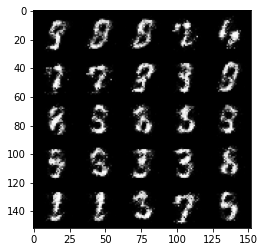

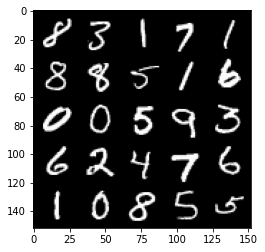

Step 14000: Generator loss: 4.054111628532408, discriminator loss: 0.0958795654401184


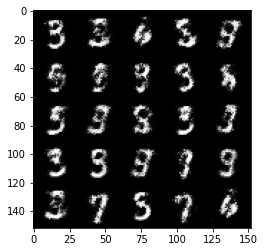

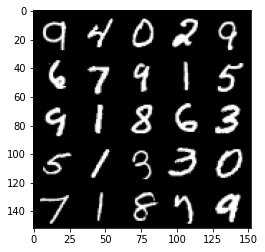

Step 14500: Generator loss: 3.8320886139869694, discriminator loss: 0.10594408409297465


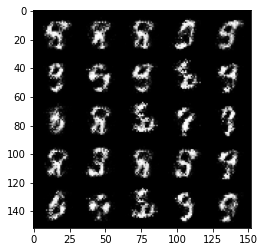

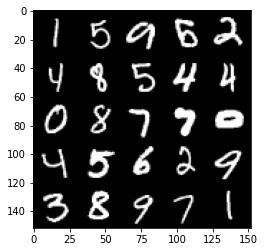

Step 15000: Generator loss: 3.8223558473587045, discriminator loss: 0.11306624541431672


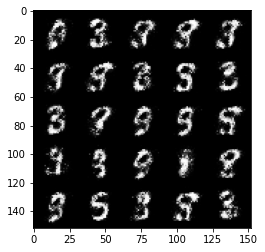

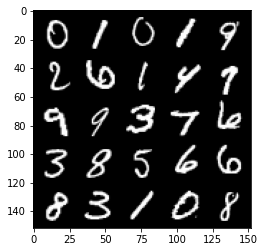

Step 15500: Generator loss: 3.9279669194221523, discriminator loss: 0.1084340177774429


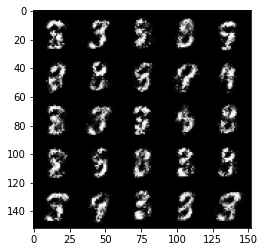

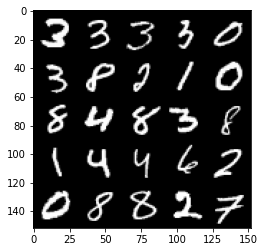

Step 16000: Generator loss: 3.827848238945006, discriminator loss: 0.12311332072317595


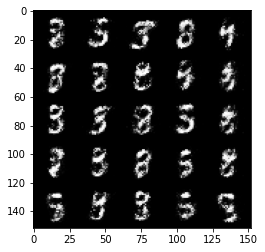

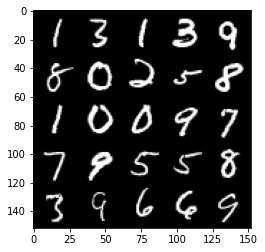

Step 16500: Generator loss: 3.7485416746139504, discriminator loss: 0.12725919982790956


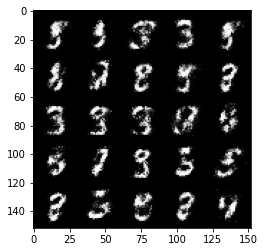

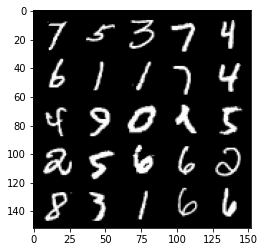

Step 17000: Generator loss: 3.628894156455995, discriminator loss: 0.1319995973557234


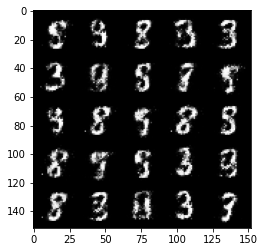

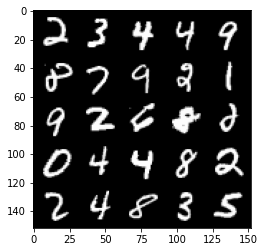

Step 17500: Generator loss: 3.514648971080777, discriminator loss: 0.13622634078562257


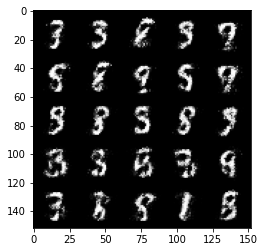

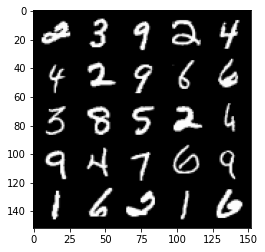

Step 18000: Generator loss: 3.4502514309883114, discriminator loss: 0.13689209854602818


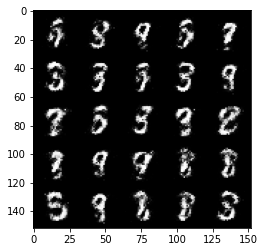

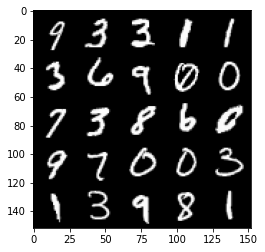

Step 18500: Generator loss: 3.497667670249939, discriminator loss: 0.14773972423374657


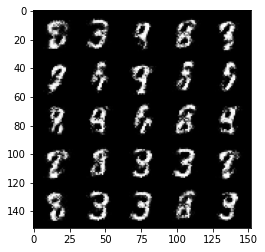

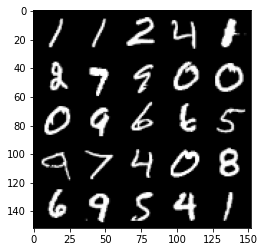

Step 19000: Generator loss: 3.5669228491783165, discriminator loss: 0.1348090342283248


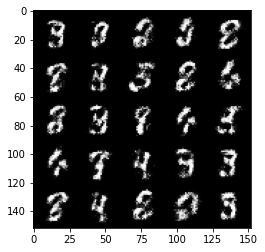

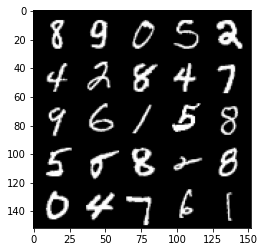

Step 19500: Generator loss: 3.3619653558731044, discriminator loss: 0.1595856758356096


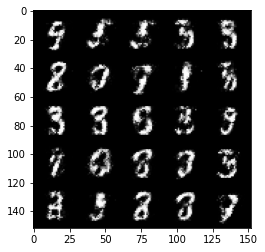

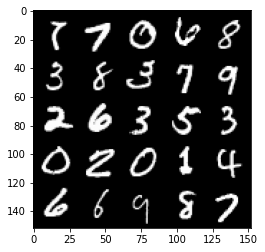

Step 20000: Generator loss: 3.1785581464767443, discriminator loss: 0.17043991123139854


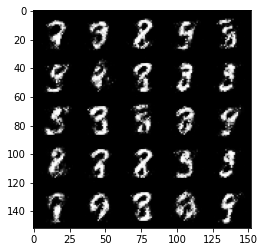

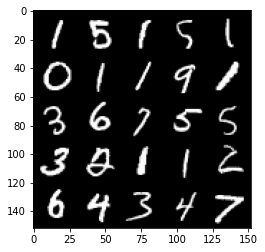

Step 20500: Generator loss: 3.2100112028121934, discriminator loss: 0.1625576363205911


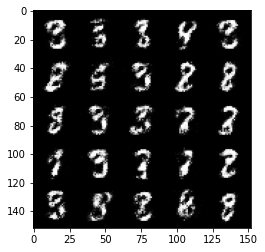

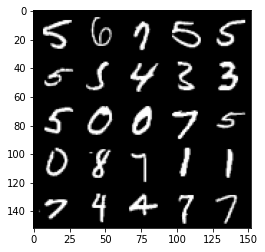

Step 21000: Generator loss: 3.1867289056777937, discriminator loss: 0.1660791027843953


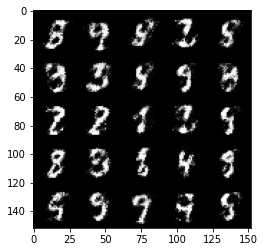

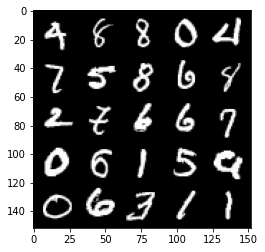

Step 21500: Generator loss: 3.2423145699501044, discriminator loss: 0.16644715298712254


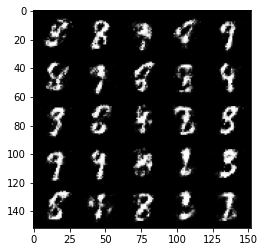

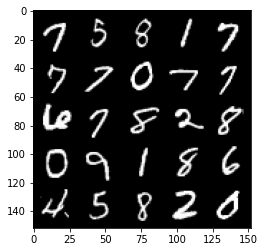

Step 22000: Generator loss: 3.241617441177369, discriminator loss: 0.17084895341098305


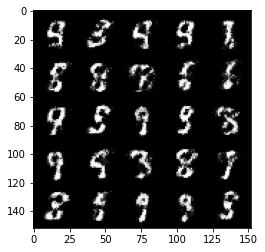

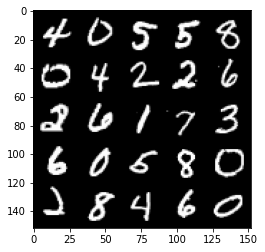

Step 22500: Generator loss: 3.1348820810318005, discriminator loss: 0.17088955888152124


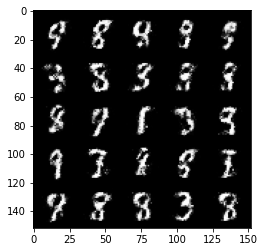

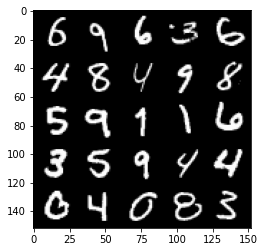

Step 23000: Generator loss: 3.0446903557777376, discriminator loss: 0.19350256454944617


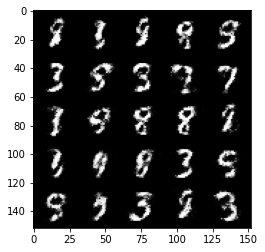

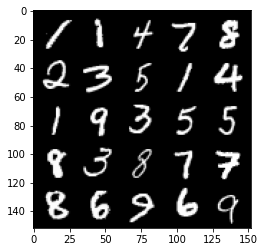

Step 23500: Generator loss: 2.7742608957290678, discriminator loss: 0.22280443736910813


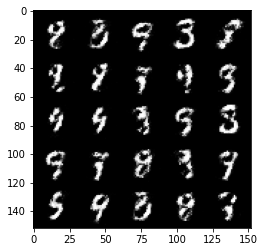

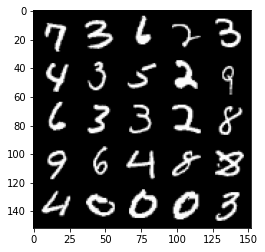

Step 24000: Generator loss: 2.759083470344541, discriminator loss: 0.21037584301829337


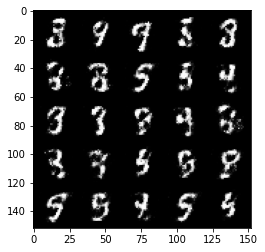

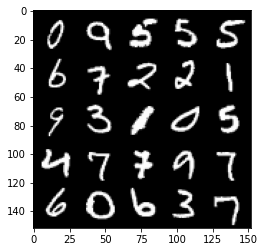

Step 24500: Generator loss: 2.7737527894973755, discriminator loss: 0.21081986102461805


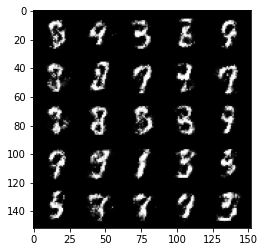

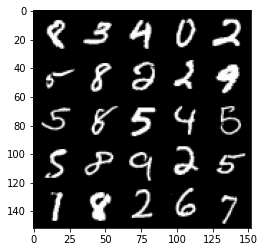

Step 25000: Generator loss: 2.8203787341117827, discriminator loss: 0.20188106435537342


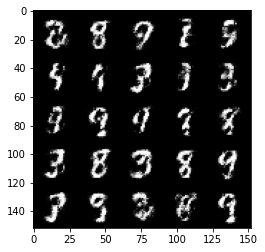

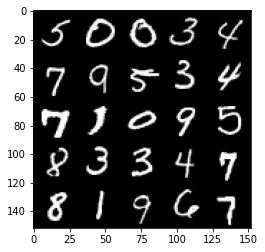

Step 25500: Generator loss: 2.6980531210899352, discriminator loss: 0.21967459815740595


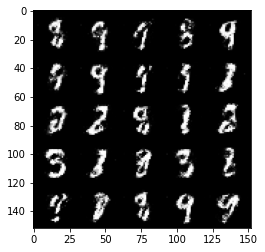

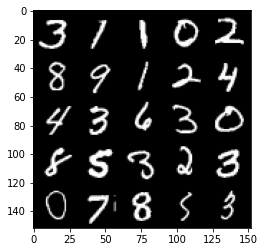

Step 26000: Generator loss: 2.7120624570846568, discriminator loss: 0.22809871524572364


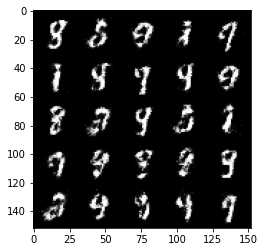

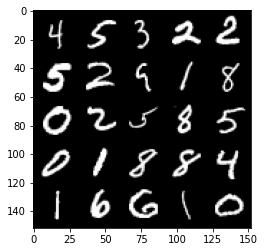

Step 26500: Generator loss: 2.6214619259834313, discriminator loss: 0.23857455801963817


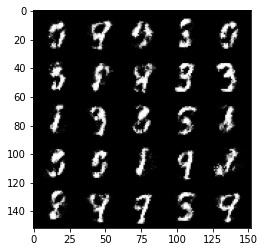

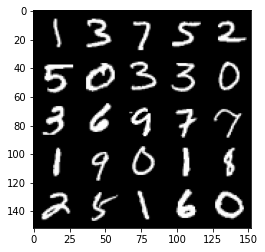

Step 27000: Generator loss: 2.5934095692634567, discriminator loss: 0.2297694151103497


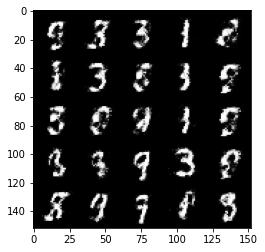

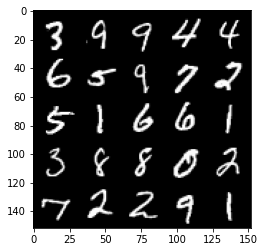

Step 27500: Generator loss: 2.5096285810470595, discriminator loss: 0.2492047414481642


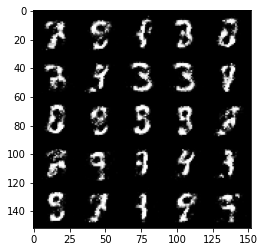

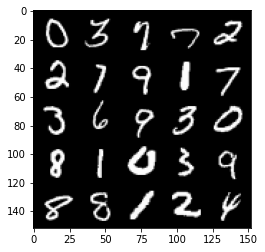

Step 28000: Generator loss: 2.535007156372069, discriminator loss: 0.24151559188962002


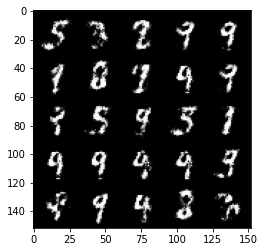

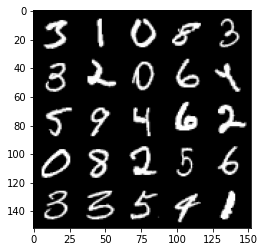

Step 28500: Generator loss: 2.596459105014799, discriminator loss: 0.23349995037913304


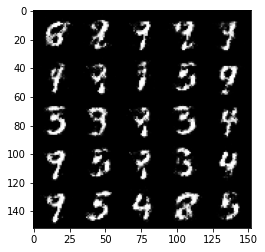

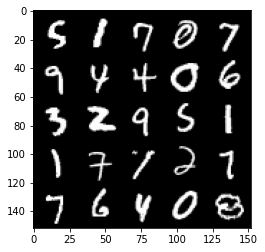

Step 29000: Generator loss: 2.6586401920318603, discriminator loss: 0.2317764311432837


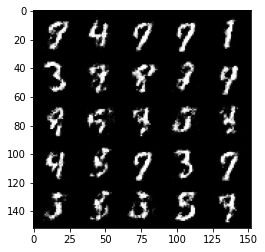

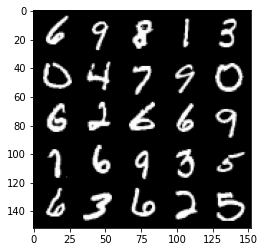

Step 29500: Generator loss: 2.4898832395076766, discriminator loss: 0.254354014903307


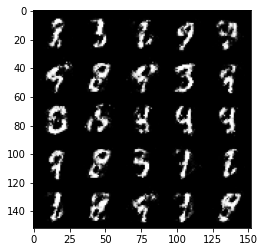

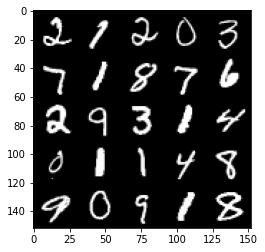

Step 30000: Generator loss: 2.49375751209259, discriminator loss: 0.24769466638565055


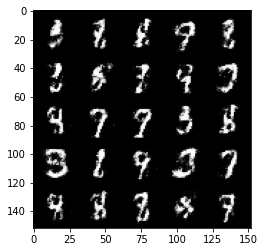

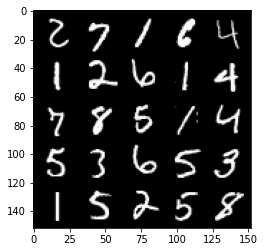

Step 30500: Generator loss: 2.457498100519181, discriminator loss: 0.2582758779525756


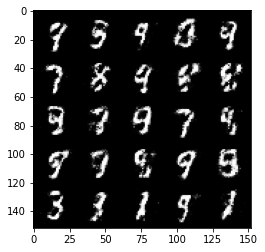

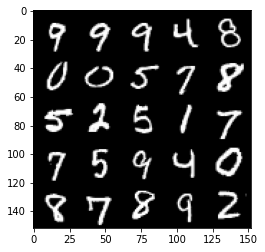

Step 31000: Generator loss: 2.4918739843368556, discriminator loss: 0.2515833650529383


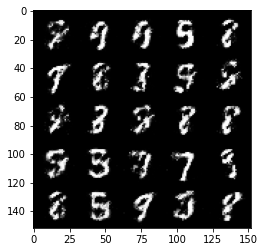

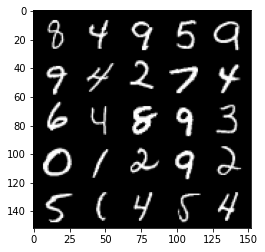

Step 31500: Generator loss: 2.657931258678438, discriminator loss: 0.22545691405236706


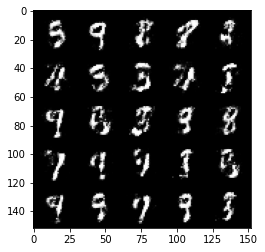

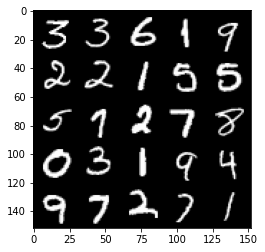

Step 32000: Generator loss: 2.5763197770118715, discriminator loss: 0.24367162600159628


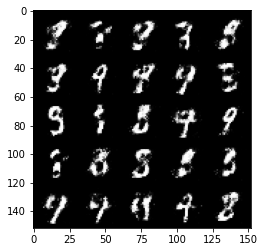

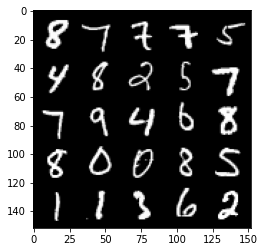

Step 32500: Generator loss: 2.495214505434038, discriminator loss: 0.2592625245153905


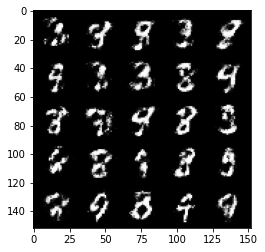

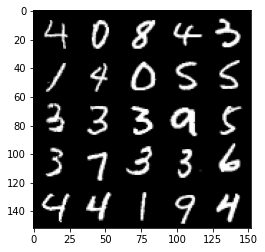

Step 33000: Generator loss: 2.3913807318210614, discriminator loss: 0.2740376710593703


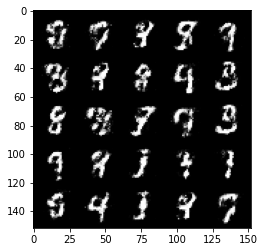

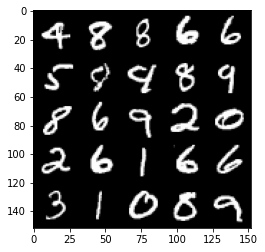

Step 33500: Generator loss: 2.2729255571365363, discriminator loss: 0.2914634633958342


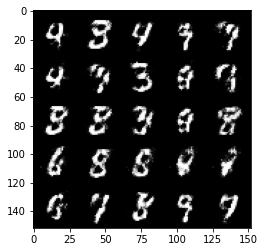

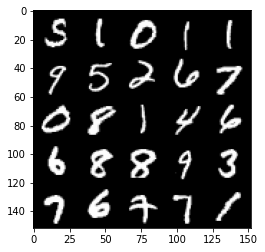

Step 34000: Generator loss: 2.301561381340027, discriminator loss: 0.2917841407060623


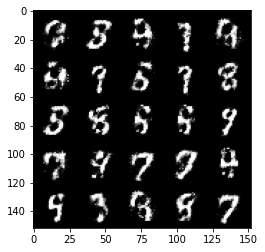

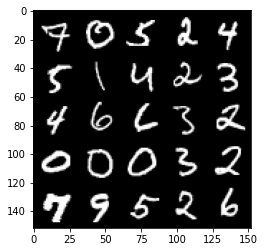

Step 34500: Generator loss: 2.144999066352843, discriminator loss: 0.330000823915005


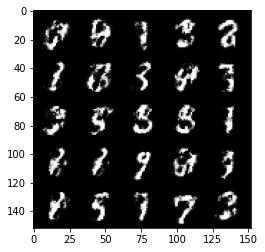

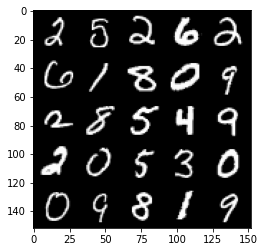

Step 35000: Generator loss: 2.1244479737281785, discriminator loss: 0.3142967270314693


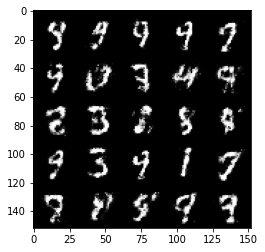

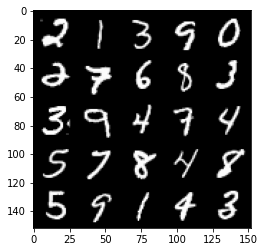

Step 35500: Generator loss: 2.268892402172089, discriminator loss: 0.2905909238457682


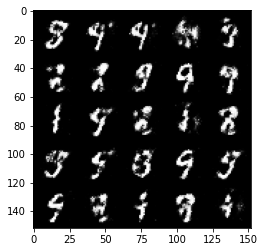

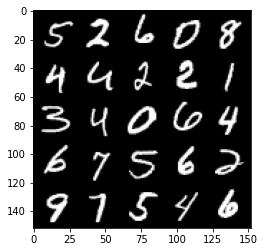

Step 36000: Generator loss: 2.1096325230598447, discriminator loss: 0.3317558503746985


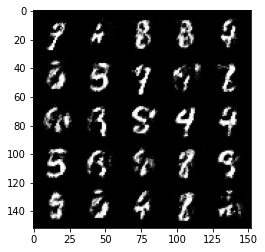

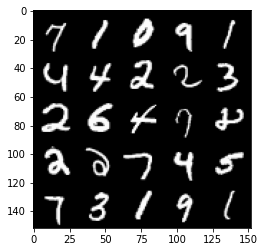

Step 36500: Generator loss: 2.1426417093276973, discriminator loss: 0.32165511277318


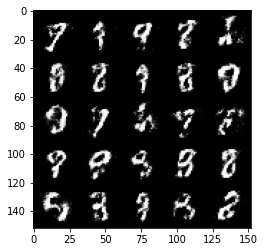

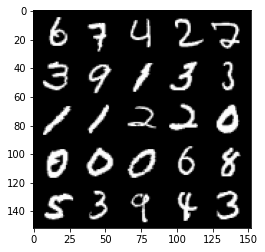

Step 37000: Generator loss: 2.1047433445453634, discriminator loss: 0.32600553789734843


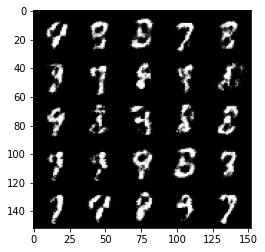

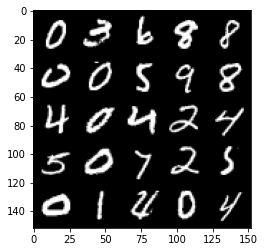

Step 37500: Generator loss: 2.1758122923374166, discriminator loss: 0.31386259627342206


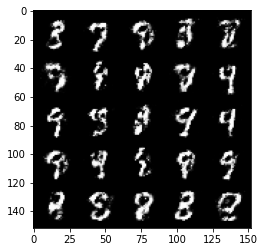

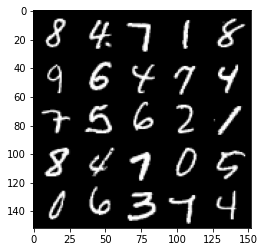

Step 38000: Generator loss: 2.1882655770778636, discriminator loss: 0.30251628112792955


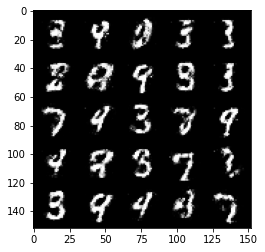

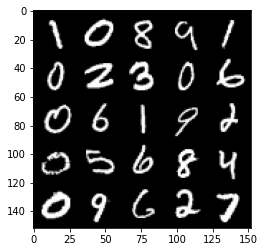

Step 38500: Generator loss: 2.138565303564071, discriminator loss: 0.3103436235487461


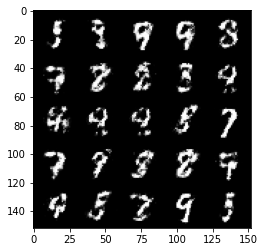

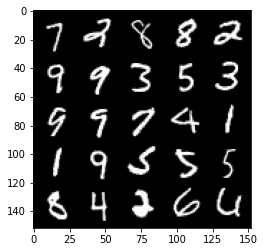

Step 39000: Generator loss: 2.0678466026782982, discriminator loss: 0.323482864677906


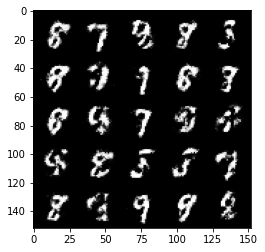

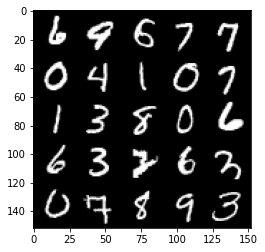

Step 39500: Generator loss: 2.081039215803147, discriminator loss: 0.3205735318660738


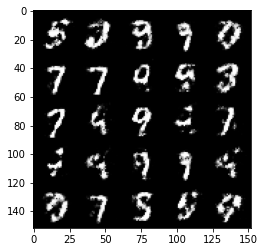

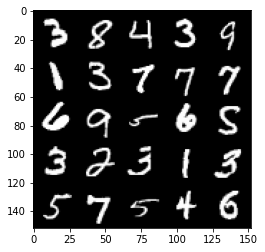

Step 40000: Generator loss: 2.0067253360748287, discriminator loss: 0.33895974332094186


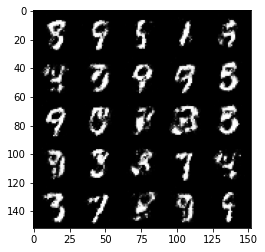

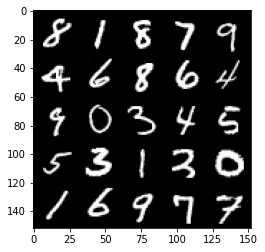

Step 40500: Generator loss: 2.078452005386352, discriminator loss: 0.31318874508142475


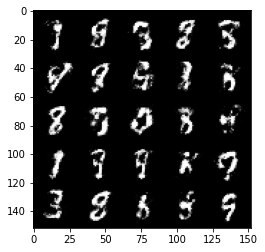

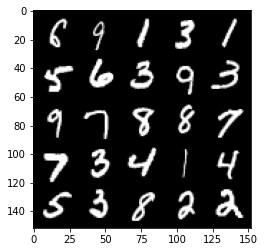

Step 41000: Generator loss: 2.112260262250902, discriminator loss: 0.3035168757736682


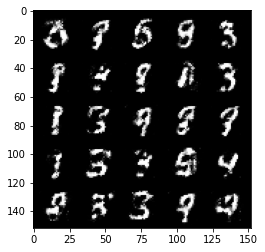

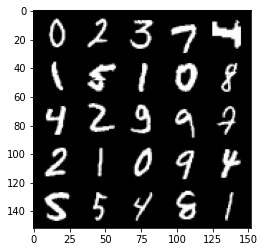

Step 41500: Generator loss: 2.136430578708648, discriminator loss: 0.31073522663116454


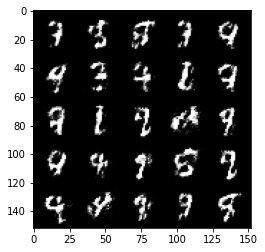

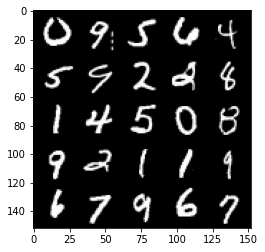

Step 42000: Generator loss: 2.109609822750091, discriminator loss: 0.309101578325033


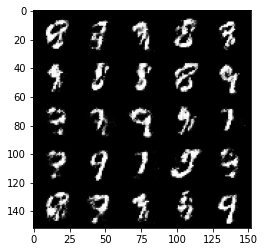

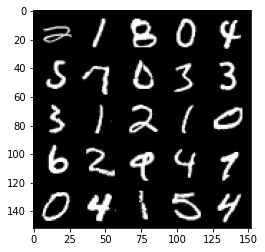

Step 42500: Generator loss: 2.0351206645965587, discriminator loss: 0.3199968438744545


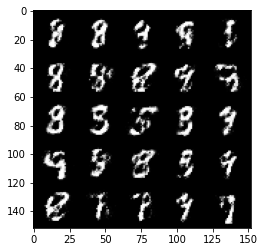

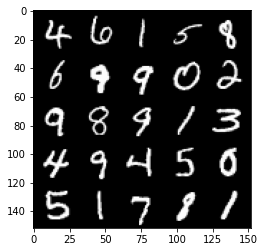

Step 43000: Generator loss: 1.974968442440034, discriminator loss: 0.33404470258951174


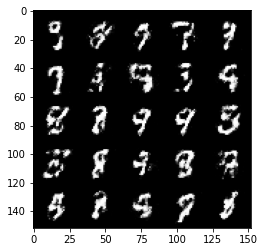

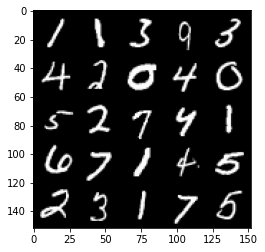

Step 43500: Generator loss: 2.015241749763489, discriminator loss: 0.32606680545210825


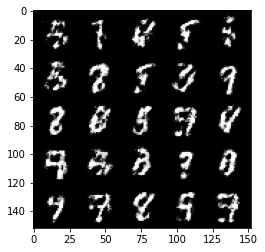

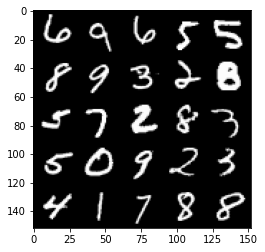

Step 44000: Generator loss: 2.060049790859224, discriminator loss: 0.3180850151181219


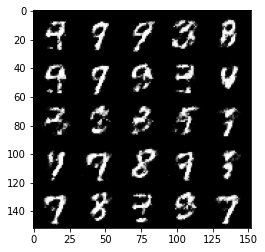

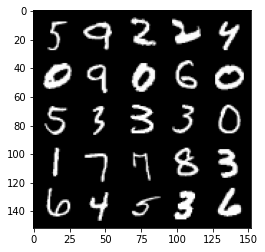

Step 44500: Generator loss: 2.049504680633545, discriminator loss: 0.3126427959501744


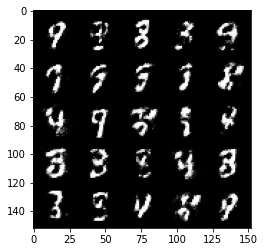

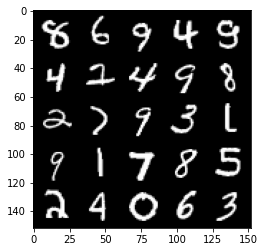

Step 45000: Generator loss: 1.9661297121047976, discriminator loss: 0.3430618872344494


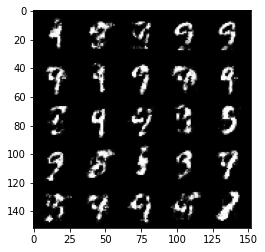

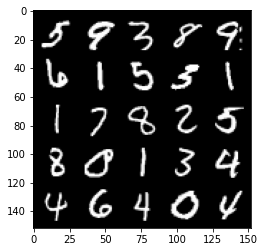

Step 45500: Generator loss: 2.036497845172882, discriminator loss: 0.31340622106194466


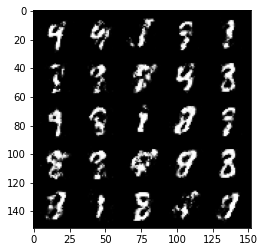

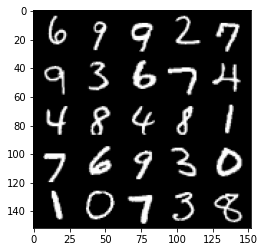

Step 46000: Generator loss: 2.0302134180068974, discriminator loss: 0.321447706460953


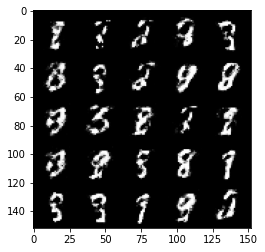

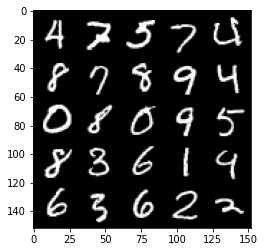

Step 46500: Generator loss: 1.981619951963423, discriminator loss: 0.3368425453901292


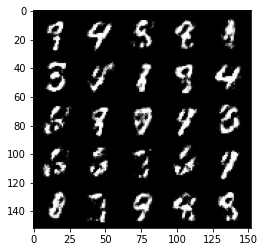

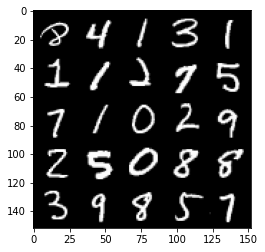

Step 47000: Generator loss: 1.9238804841041572, discriminator loss: 0.34260677480697643


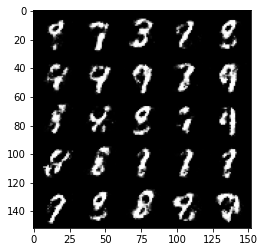

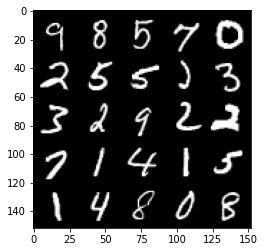

Step 47500: Generator loss: 1.825687285900116, discriminator loss: 0.36187547564506545


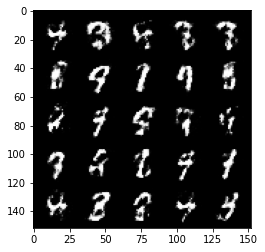

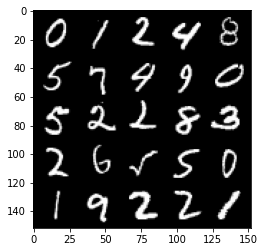

Step 48000: Generator loss: 1.8225751202106468, discriminator loss: 0.3652629620432853


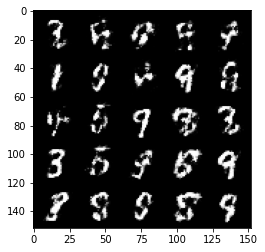

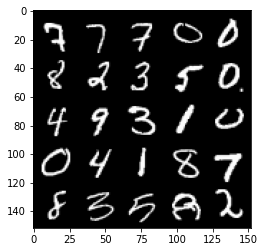

Step 48500: Generator loss: 1.8007516705989859, discriminator loss: 0.3703034430146221


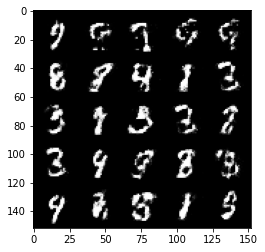

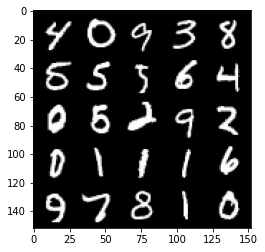

Step 49000: Generator loss: 1.7272966470718378, discriminator loss: 0.39440216171741493


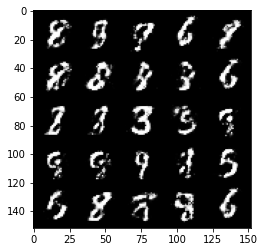

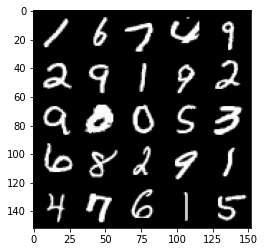

Step 49500: Generator loss: 1.6792370042800908, discriminator loss: 0.39136094266176197


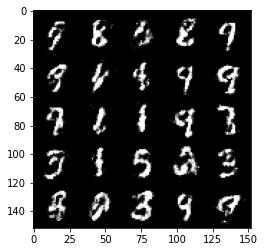

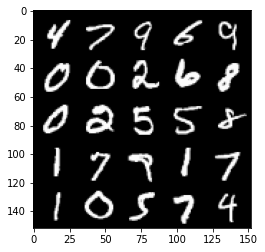

Step 50000: Generator loss: 1.6832236053943637, discriminator loss: 0.39135403883457176


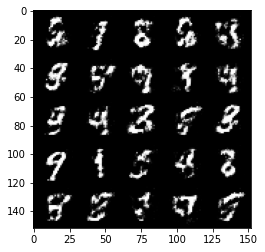

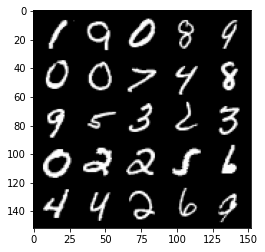

Step 50500: Generator loss: 1.8124040596485116, discriminator loss: 0.3587833719849587


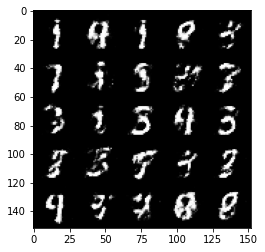

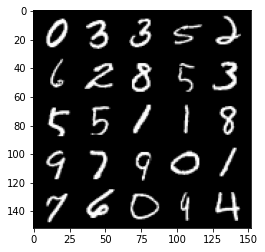

Step 51000: Generator loss: 1.801887573480607, discriminator loss: 0.3608320826292039


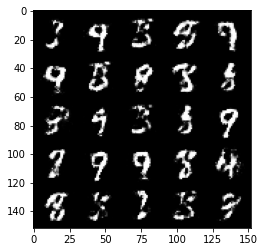

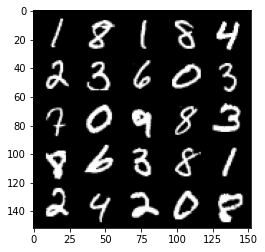

Step 51500: Generator loss: 1.7630889139175416, discriminator loss: 0.370813854575157


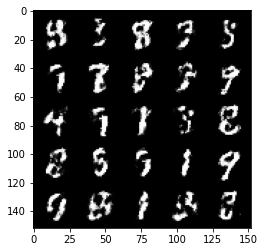

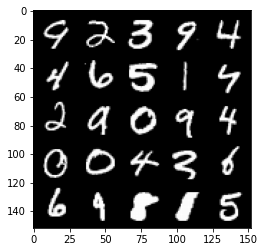

Step 52000: Generator loss: 1.8301904141902923, discriminator loss: 0.35424939495325064


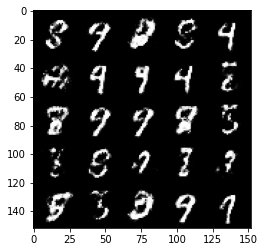

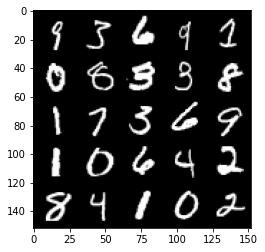

Step 52500: Generator loss: 1.763203299522401, discriminator loss: 0.3745600599050525


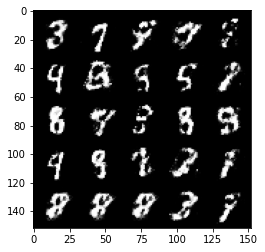

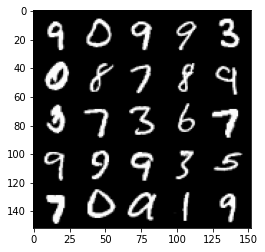

Step 53000: Generator loss: 1.6734409887790687, discriminator loss: 0.399851791441441


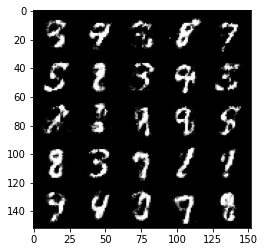

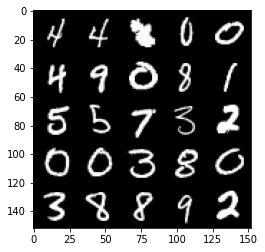

Step 53500: Generator loss: 1.668086847066879, discriminator loss: 0.388134532272816


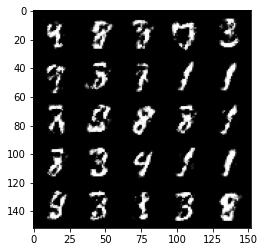

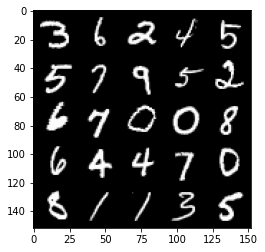

Step 54000: Generator loss: 1.7801508762836467, discriminator loss: 0.3561151864528654


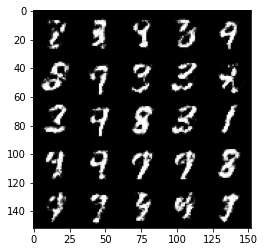

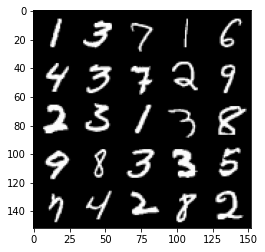

Step 54500: Generator loss: 1.7284875991344444, discriminator loss: 0.37720887905359274


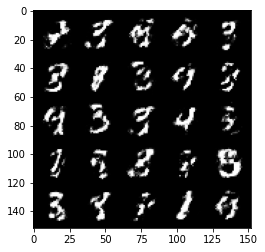

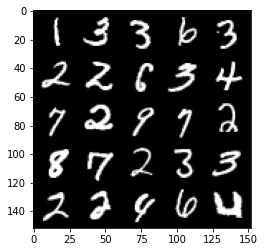

Step 55000: Generator loss: 1.7097502467632308, discriminator loss: 0.3818819851279261


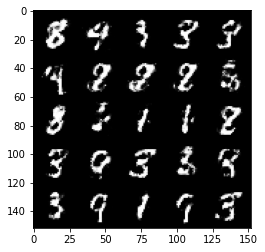

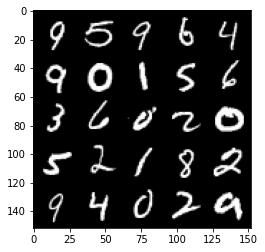

Step 55500: Generator loss: 1.7503205242156983, discriminator loss: 0.36805646377801843


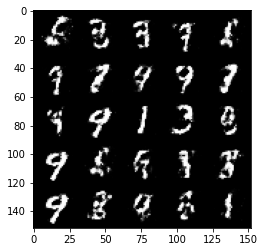

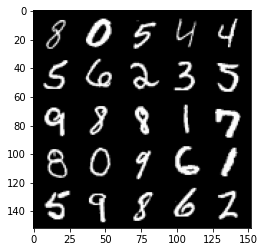

Step 56000: Generator loss: 1.6874894826412203, discriminator loss: 0.3940459837317467


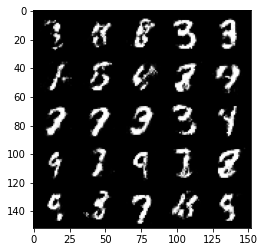

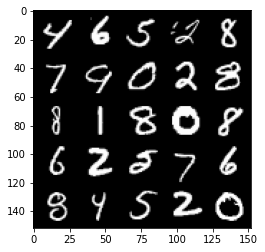

Step 56500: Generator loss: 1.6842975244522094, discriminator loss: 0.4100569473505021


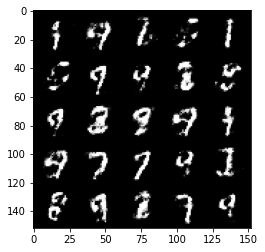

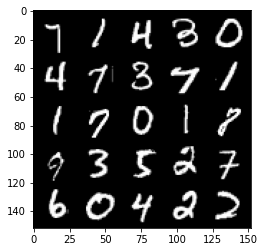

Step 57000: Generator loss: 1.6285438210964212, discriminator loss: 0.4181341657042502


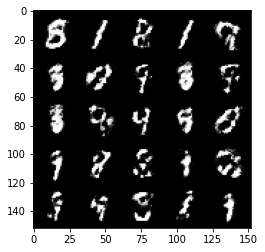

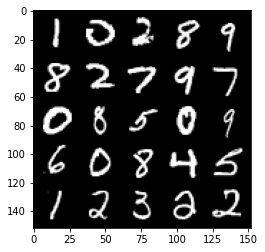

Step 57500: Generator loss: 1.5867128572463989, discriminator loss: 0.42016033142805104


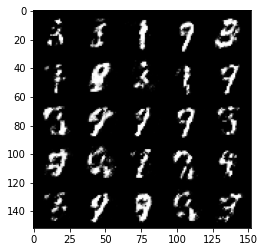

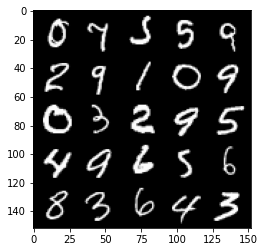

Step 58000: Generator loss: 1.6012056798934924, discriminator loss: 0.4175917257666586


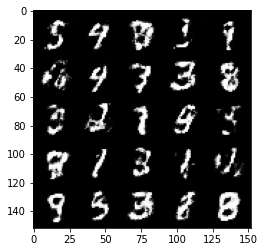

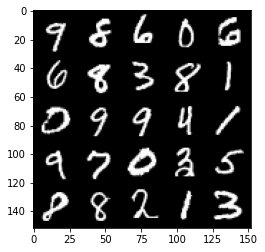

Step 58500: Generator loss: 1.5578085477352148, discriminator loss: 0.43802189379930495


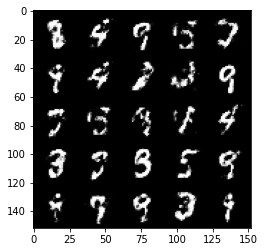

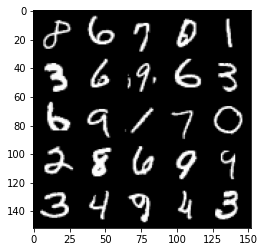

Step 59000: Generator loss: 1.6474175422191626, discriminator loss: 0.3985399203896521


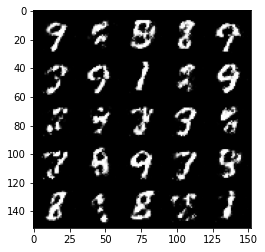

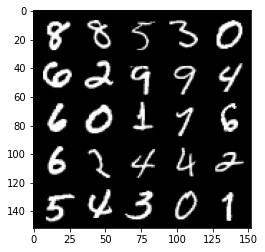

Step 59500: Generator loss: 1.7585410964489008, discriminator loss: 0.3830381628870965


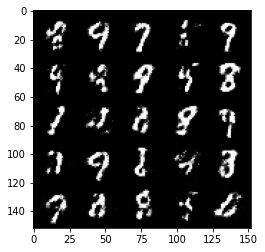

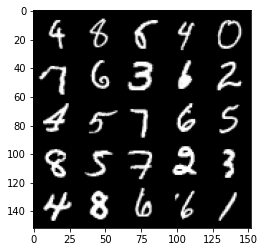

Step 60000: Generator loss: 1.6308796017169966, discriminator loss: 0.423889472901821


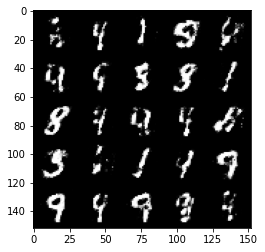

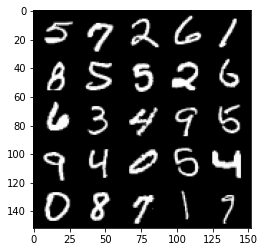

Step 60500: Generator loss: 1.6175792188644407, discriminator loss: 0.40509814023971535


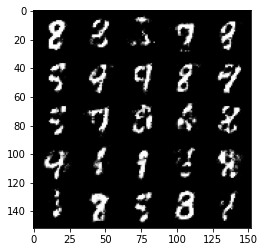

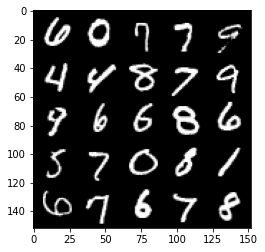

Step 61000: Generator loss: 1.5906325912475583, discriminator loss: 0.4205338240265847


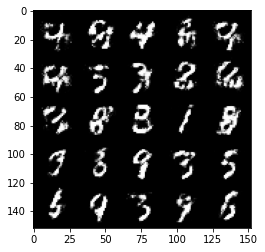

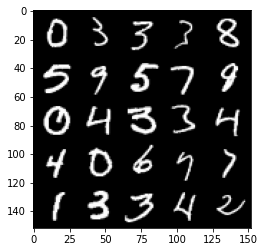

Step 61500: Generator loss: 1.580086554288865, discriminator loss: 0.41523091936111467


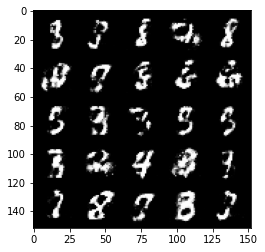

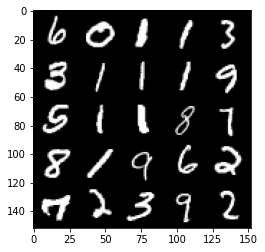

Step 62000: Generator loss: 1.567226012706757, discriminator loss: 0.4202694936990735


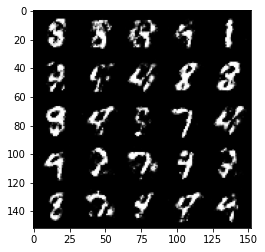

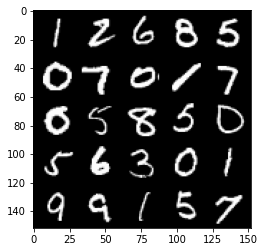

Step 62500: Generator loss: 1.5764085106849688, discriminator loss: 0.41477441990375513


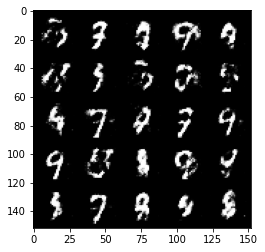

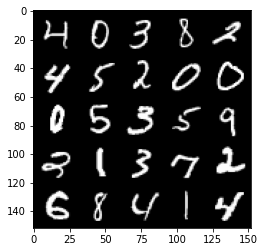

Step 63000: Generator loss: 1.5977315628528594, discriminator loss: 0.41391674000024764


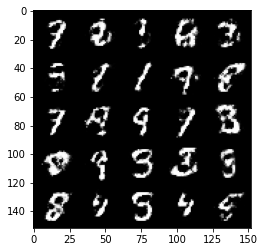

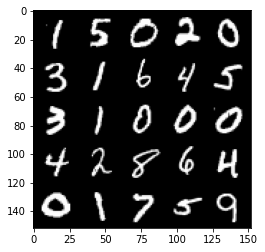

Step 63500: Generator loss: 1.528552342653274, discriminator loss: 0.4314314847588537


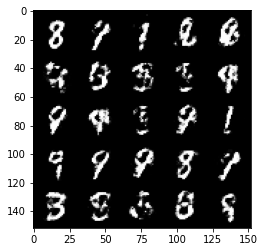

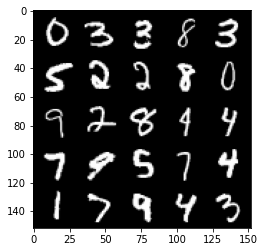

Step 64000: Generator loss: 1.5721130871772775, discriminator loss: 0.41793538862466795


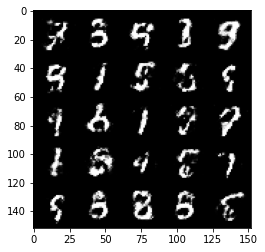

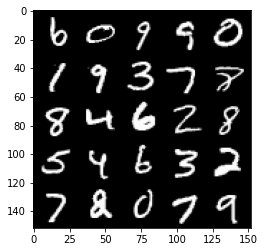

Step 64500: Generator loss: 1.5244487934112543, discriminator loss: 0.43223393964767454


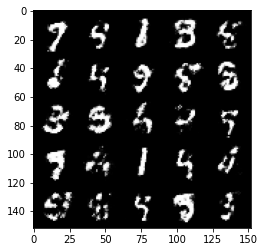

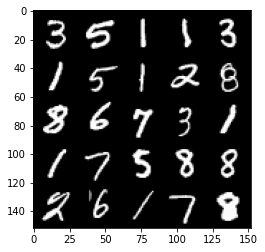

Step 65000: Generator loss: 1.500972099542619, discriminator loss: 0.43311945205926905


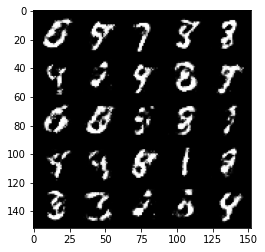

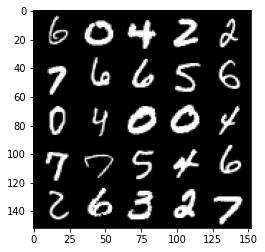

Step 65500: Generator loss: 1.5151646070480345, discriminator loss: 0.4295145266652104


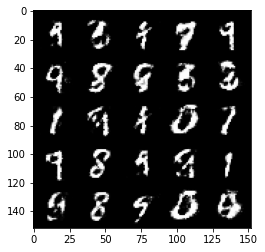

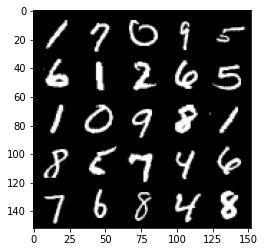

Step 66000: Generator loss: 1.4324714829921734, discriminator loss: 0.4531171501278877


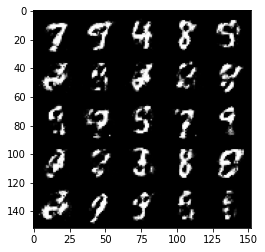

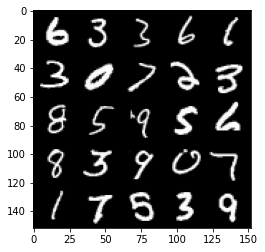

Step 66500: Generator loss: 1.535116030693055, discriminator loss: 0.4064969282746316


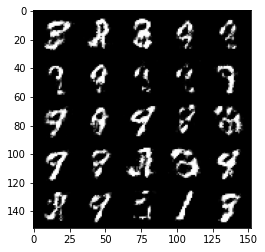

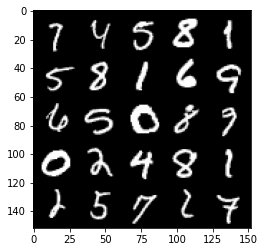

Step 67000: Generator loss: 1.5070927114486683, discriminator loss: 0.43311070513725286


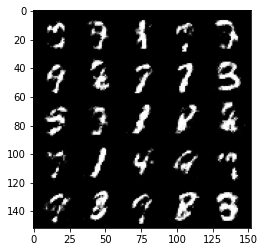

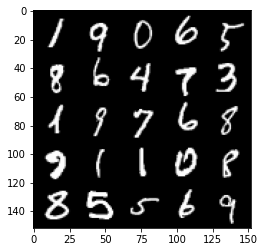

Step 67500: Generator loss: 1.5154644548892986, discriminator loss: 0.4395789413452151


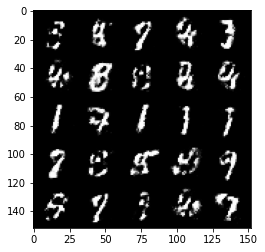

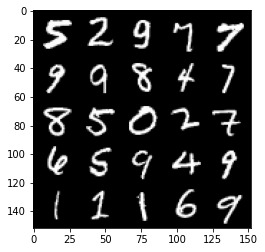

Step 68000: Generator loss: 1.4601952083110827, discriminator loss: 0.44592285162210477


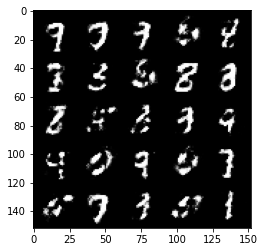

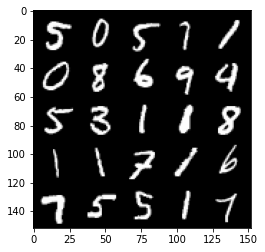

Step 68500: Generator loss: 1.519667715072632, discriminator loss: 0.4326786808967589


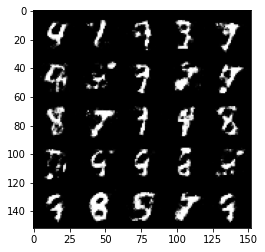

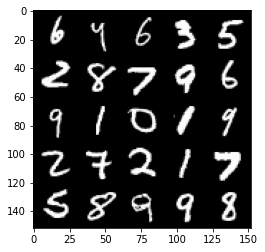

Step 69000: Generator loss: 1.4774923593997946, discriminator loss: 0.4399154198765757


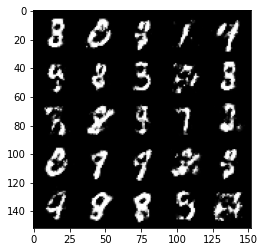

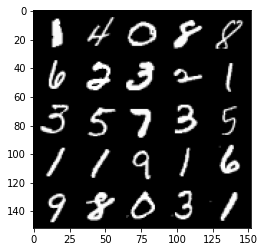

Step 69500: Generator loss: 1.5200393834114088, discriminator loss: 0.42665235280990643


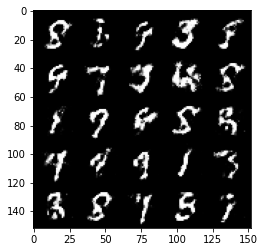

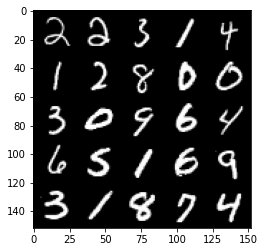

Step 70000: Generator loss: 1.4587340188026428, discriminator loss: 0.442399682700634


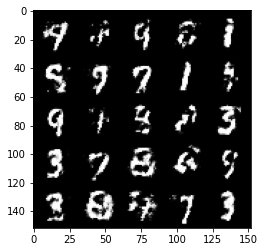

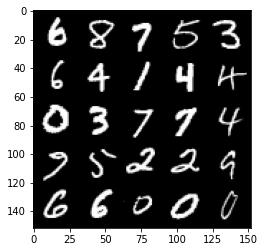

Step 70500: Generator loss: 1.3995787496566778, discriminator loss: 0.4557895151972768


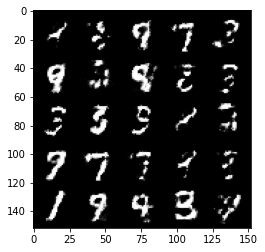

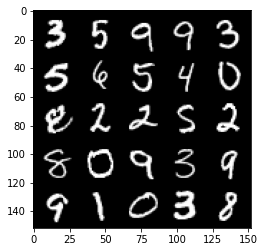

Step 71000: Generator loss: 1.488831451654436, discriminator loss: 0.42816149342060117


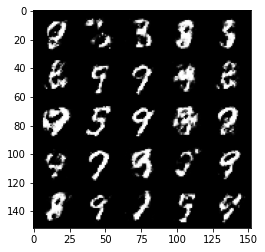

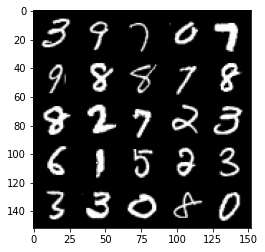

Step 71500: Generator loss: 1.3754068849086758, discriminator loss: 0.46081717151403406


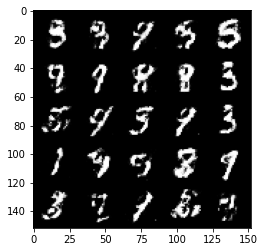

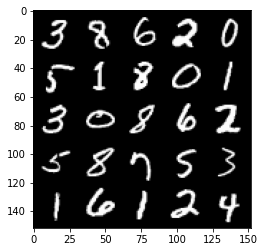

Step 72000: Generator loss: 1.4085216877460474, discriminator loss: 0.4594957042336467


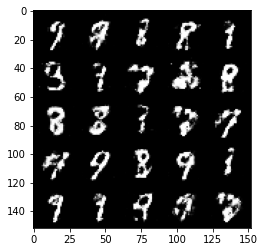

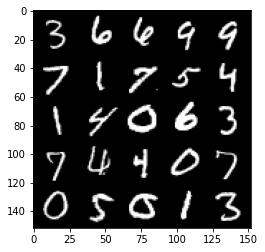

Step 72500: Generator loss: 1.3757626373767848, discriminator loss: 0.4863225079774861


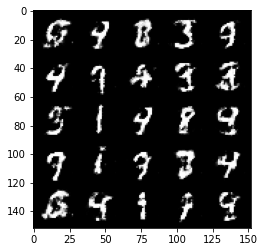

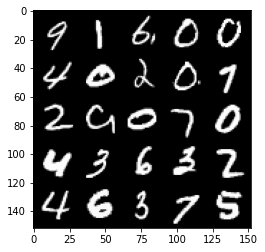

Step 73000: Generator loss: 1.3073982386589047, discriminator loss: 0.4926806581616402


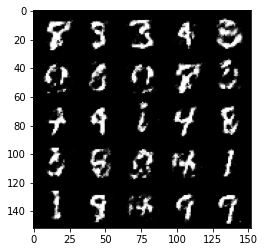

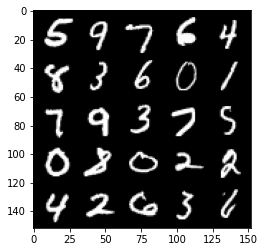

Step 73500: Generator loss: 1.3523486087322225, discriminator loss: 0.4696483024954795


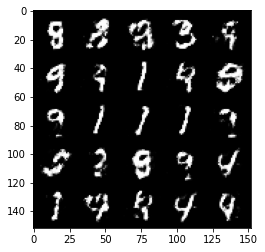

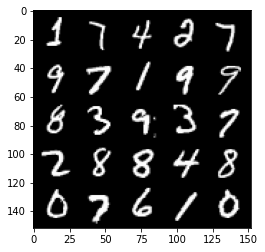

Step 74000: Generator loss: 1.3723320307731637, discriminator loss: 0.47050182700157156


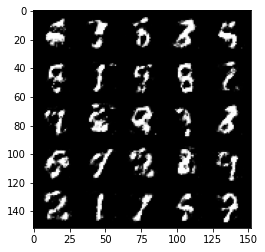

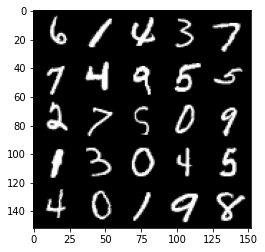

Step 74500: Generator loss: 1.3274284923076622, discriminator loss: 0.4835500849485396


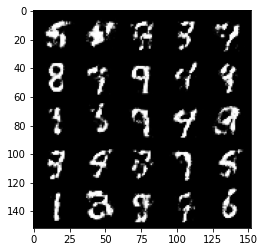

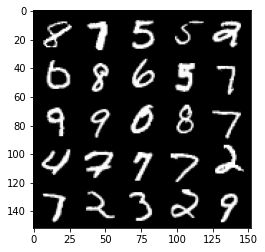

Step 75000: Generator loss: 1.3654726214408865, discriminator loss: 0.46569242316484466


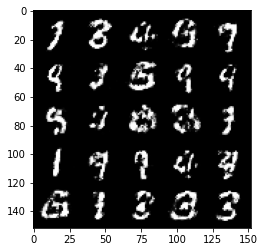

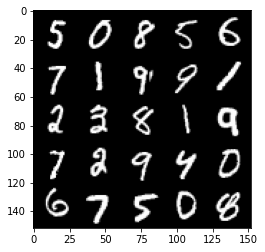

Step 75500: Generator loss: 1.417111050844192, discriminator loss: 0.4623264899253847


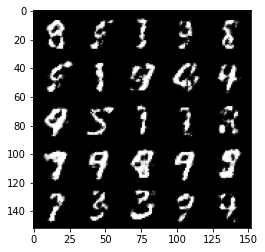

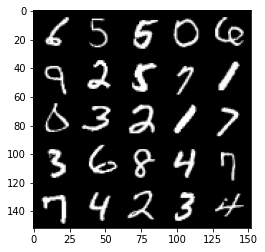

Step 76000: Generator loss: 1.327760093688966, discriminator loss: 0.49076392805576263


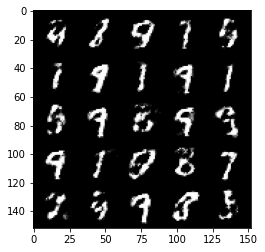

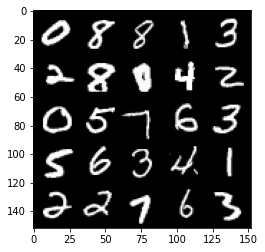

Step 76500: Generator loss: 1.3127960107326508, discriminator loss: 0.48612529778480545


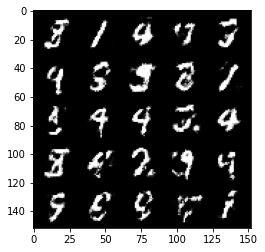

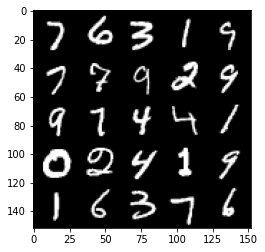

Step 77000: Generator loss: 1.2512886343002332, discriminator loss: 0.5021776456236832


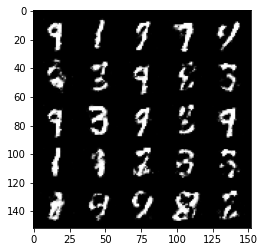

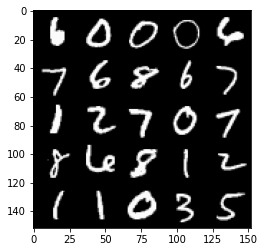

Step 77500: Generator loss: 1.2632143847942365, discriminator loss: 0.4954492116570474


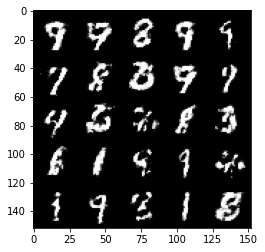

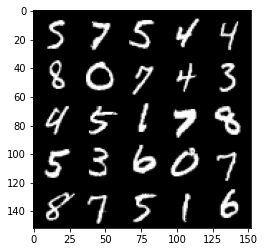

Step 78000: Generator loss: 1.2870129163265231, discriminator loss: 0.4931799284815788


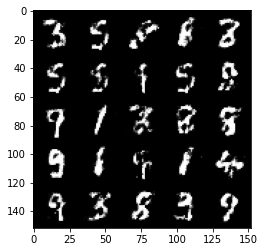

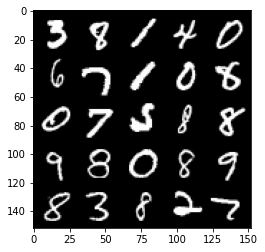

Step 78500: Generator loss: 1.2996501820087445, discriminator loss: 0.48140128093957896


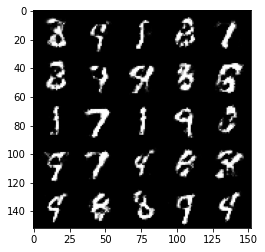

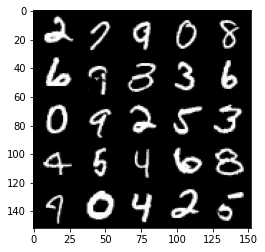

Step 79000: Generator loss: 1.2547642281055453, discriminator loss: 0.510050177872181


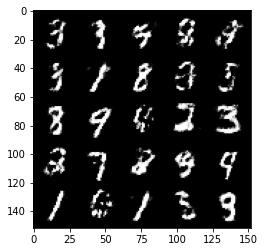

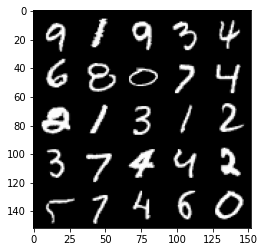

Step 79500: Generator loss: 1.186645913481713, discriminator loss: 0.5272591198682786


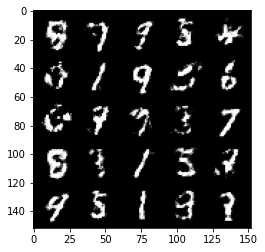

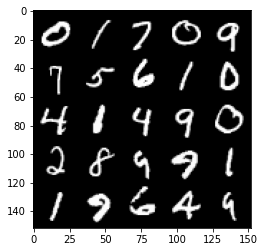

Step 80000: Generator loss: 1.2423312518596659, discriminator loss: 0.5009877127408977


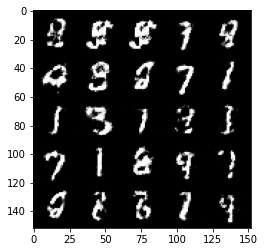

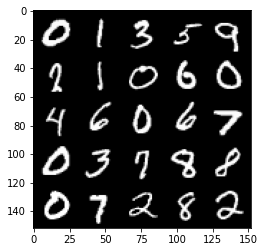

Step 80500: Generator loss: 1.238444918632507, discriminator loss: 0.5004419957995414


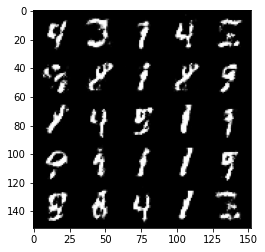

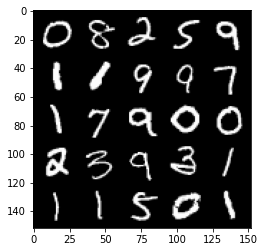

Step 81000: Generator loss: 1.2928421077728256, discriminator loss: 0.4846528459191322


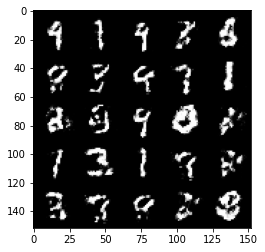

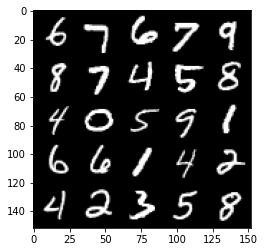

Step 81500: Generator loss: 1.2736893117427814, discriminator loss: 0.486493660211563


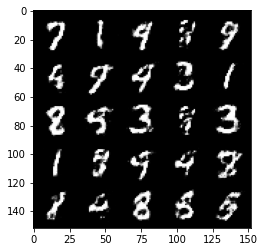

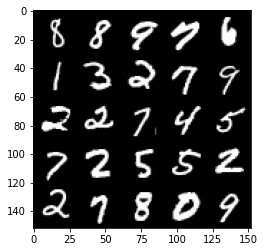

Step 82000: Generator loss: 1.28423313689232, discriminator loss: 0.4822467237710954


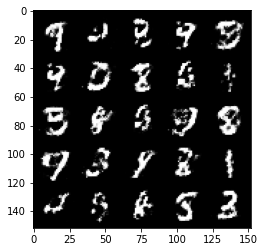

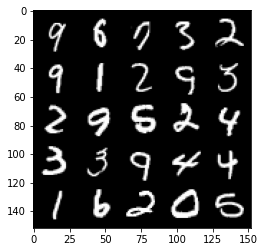

Step 82500: Generator loss: 1.229001059532167, discriminator loss: 0.5032178266644478


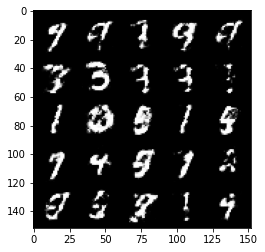

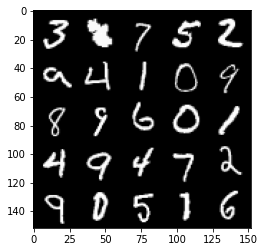

Step 83000: Generator loss: 1.2115027871131896, discriminator loss: 0.5085685914158824


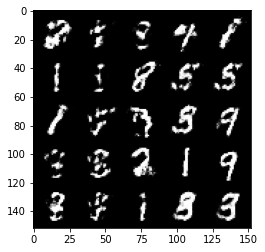

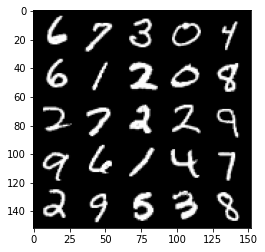

Step 83500: Generator loss: 1.2038349119424832, discriminator loss: 0.5107382456660272


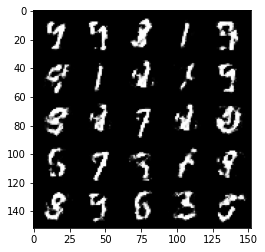

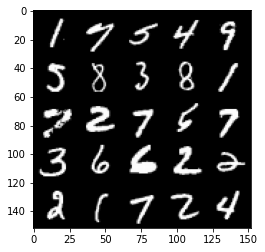

Step 84000: Generator loss: 1.2428306305408476, discriminator loss: 0.5114804996252059


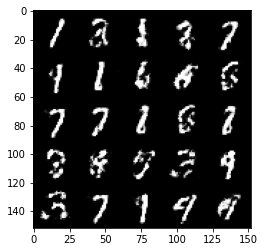

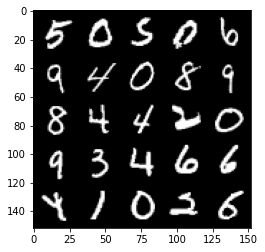

Step 84500: Generator loss: 1.1879217360019678, discriminator loss: 0.5227762154340744


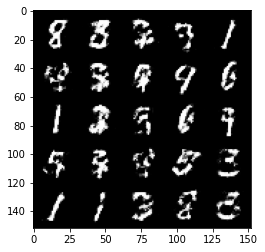

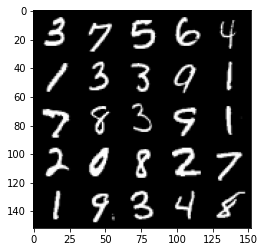

Step 85000: Generator loss: 1.2145529394149785, discriminator loss: 0.5084772645831108


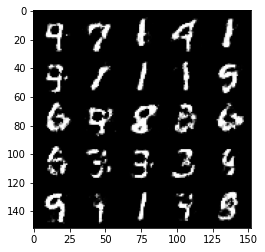

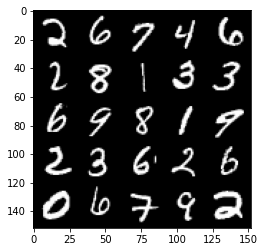

Step 85500: Generator loss: 1.1495065013170234, discriminator loss: 0.5249584950804709


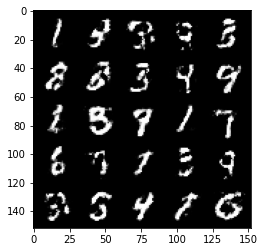

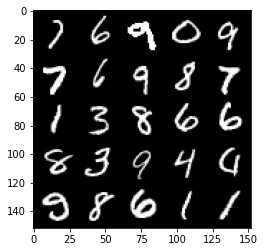

Step 86000: Generator loss: 1.162264924168586, discriminator loss: 0.523045931696892


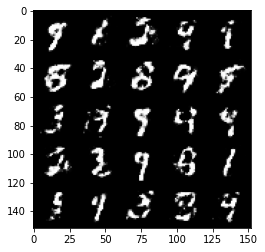

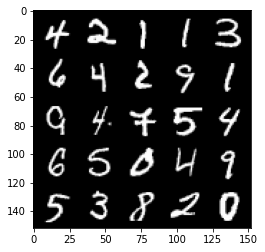

Step 86500: Generator loss: 1.2153281378746033, discriminator loss: 0.4980003300905229


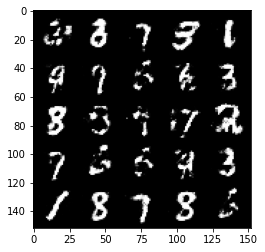

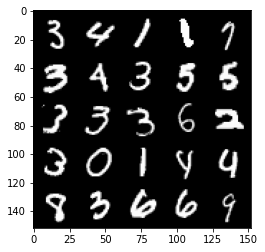

Step 87000: Generator loss: 1.1844174699783327, discriminator loss: 0.5025600520968436


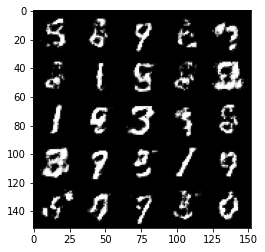

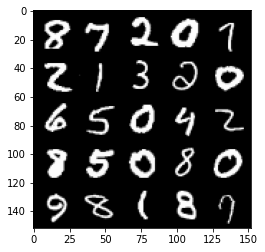

Step 87500: Generator loss: 1.1618779804706592, discriminator loss: 0.5240814498066907


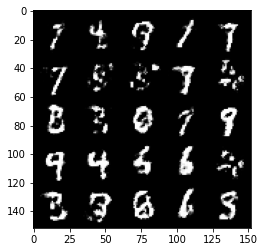

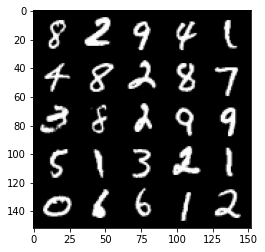

Step 88000: Generator loss: 1.1612842307090765, discriminator loss: 0.5240556792020796


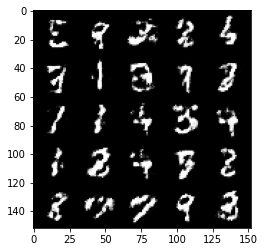

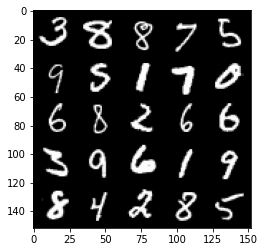

Step 88500: Generator loss: 1.0983613508939738, discriminator loss: 0.6453689599037173


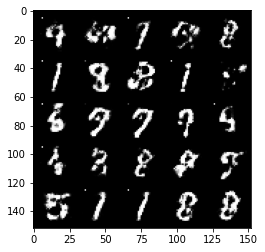

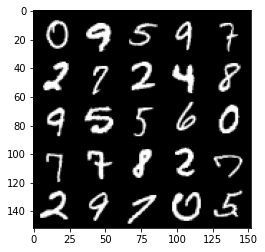

Step 89000: Generator loss: 0.8308149513006211, discriminator loss: 0.7317903238534929


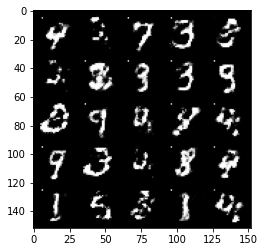

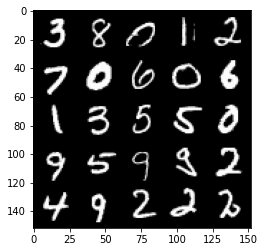

Step 89500: Generator loss: 1.003129377603531, discriminator loss: 0.536488361299038


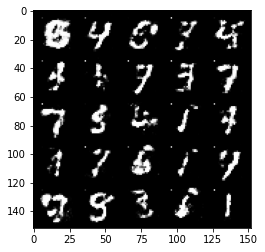

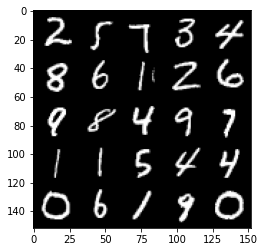

Step 90000: Generator loss: 1.0611660242080696, discriminator loss: 0.5196459164619451


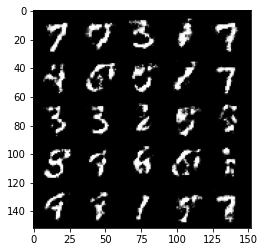

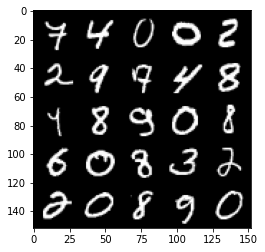

Step 90500: Generator loss: 1.102779513120651, discriminator loss: 0.5248053984642033


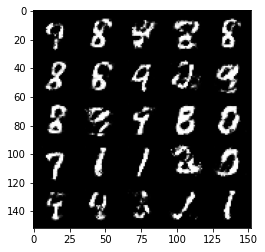

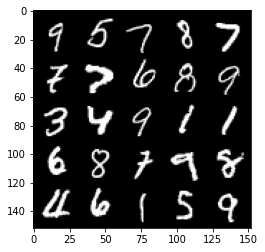

Step 91000: Generator loss: 1.147137716531753, discriminator loss: 0.522929454982281


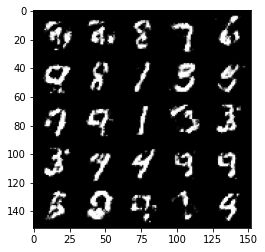

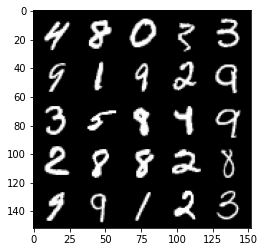

Step 91500: Generator loss: 1.1884353971481323, discriminator loss: 0.5139657638669015


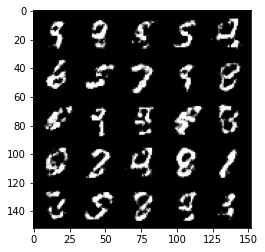

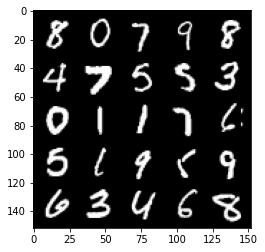

Step 92000: Generator loss: 1.2337179141044619, discriminator loss: 0.49071490383148153


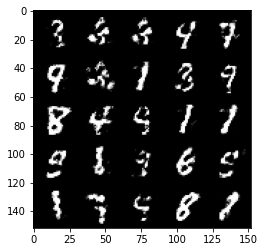

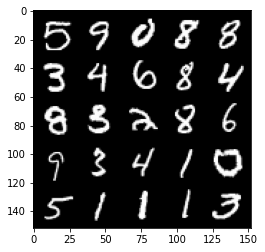

Step 92500: Generator loss: 1.1858094424009322, discriminator loss: 0.5058000558614729


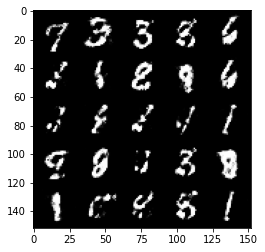

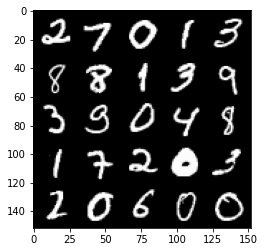

Step 93000: Generator loss: 1.165935730814934, discriminator loss: 0.5102494002580641


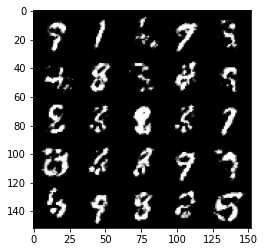

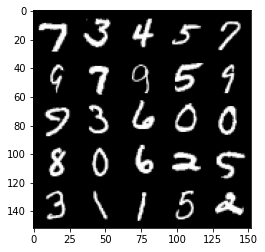

Step 93500: Generator loss: 1.1395693342685682, discriminator loss: 0.5241983413696292


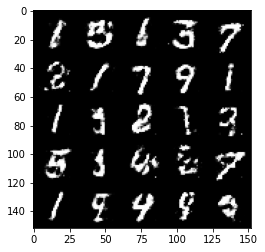

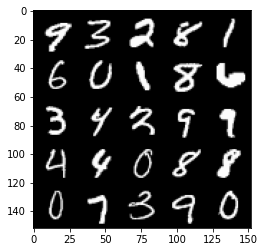

In [44]:
# UNQ_C8 (UNIQUE CELL IDENTIFIER, DO NOT EDIT)
# GRADED FUNCTION: 

cur_step = 0
mean_generator_loss = 0
mean_discriminator_loss = 0
test_generator = True # Whether the generator should be tested
gen_loss = False
error = False
for epoch in range(n_epochs):
  
    # Dataloader returns the batches
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)

        # Flatten the batch of real images from the dataset
        real = real.view(cur_batch_size, -1).to(device)

        ### Update discriminator ###
        # Zero out the gradients before backpropagation
        disc_opt.zero_grad()

        # Calculate discriminator loss
        disc_loss = get_disc_loss(gen, disc, criterion, real, cur_batch_size, z_dim, device)

        # Update gradients
        disc_loss.backward(retain_graph=True)

        # Update optimizer
        disc_opt.step()

        # For testing purposes, to keep track of the generator weights
        if test_generator:
            old_generator_weights = gen.gen[0][0].weight.detach().clone()

        ### Update generator ###
        #     Hint: This code will look a lot like the discriminator updates!
        #     These are the steps you will need to complete:
        #       1) Zero out the gradients.
        #       2) Calculate the generator loss, assigning it to gen_loss.
        #       3) Backprop through the generator: update the gradients and optimizer.
        #### START CODE HERE ####
        gen_opt.zero_grad()
        gen_loss = get_gen_loss(gen, disc, criterion, cur_batch_size, z_dim, device)
        gen_loss.backward(retain_graph=True)
        gen_opt.step()
        
        #### END CODE HERE ####

        # For testing purposes, to check that your code changes the generator weights
        if test_generator:
            try:
                assert lr > 0.0000002 or (gen.gen[0][0].weight.grad.abs().max() < 0.0005 and epoch == 0)
                assert torch.any(gen.gen[0][0].weight.detach().clone() != old_generator_weights)
            except:
                error = True
                print("Runtime tests have failed")

        # Keep track of the average discriminator loss
        mean_discriminator_loss += disc_loss.item() / display_step

        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step

        ### Visualization code ###
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, discriminator loss: {mean_discriminator_loss}")
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            show_tensor_images(fake)
            show_tensor_images(real)
            mean_generator_loss = 0
            mean_discriminator_loss = 0
        cur_step += 1
